## Library

In [591]:
# Main library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Preprocessing
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV
)

from sklearn.preprocessing import (
    StandardScaler,
    MaxAbsScaler,
    MinMaxScaler,
    RobustScaler
)
from sklearn.compose import ColumnTransformer
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_regression
from sklearn.linear_model import Lasso

# Imputation
from sklearn.impute import (
    KNNImputer, 
    SimpleImputer
)

from feature_engine.imputation import (
    ArbitraryNumberImputer,
    MeanMedianImputer,
    RandomSampleImputer,
    EndTailImputer,
    CategoricalImputer
)

# Discretization
from feature_engine.discretisation import (
    EqualFrequencyDiscretiser, 
    EqualWidthDiscretiser
)

# Feature selection
from feature_engine.selection import (
    DropCorrelatedFeatures, 
    SmartCorrelatedSelection , 
    DropDuplicateFeatures, 
    DropConstantFeatures
)

# Encoding
from feature_engine.encoding import (
    RareLabelEncoder,
    OneHotEncoder,
    OrdinalEncoder,
    MeanEncoder,
    CountFrequencyEncoder,
    
)

#Transformation
from feature_engine.transformation import (
    LogCpTransformer,
    ReciprocalTransformer,
    PowerTransformer,
    YeoJohnsonTransformer,
    BoxCoxTransformer
)

#Algorithms
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import  LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

from xgboost import XGBRFRegressor


pd.set_option('display.max_columns', None)

# important
import warnings
warnings.filterwarnings('ignore')

## Functions

In [592]:
def calculate_mean_target_per_category(df, var):
    """
   this function calculates the average cost and number of houses for each label in the variable
    """
    total_houses = len(df)
    
    temp_df = pd.Series(df[var].value_counts() / total_houses).reset_index()
    temp_df.columns = [var, 'perc_houses']
    
    temp_df = temp_df.merge(
        df.groupby([var])['SalePrice'].mean().reset_index(),
        on = var,
        how = 'left'
    )
    
    return temp_df

In [593]:
def plot_categories(df, var):
    """
    this function draws graphs for calculating the average values ​​​​of the cost and number of houses
    """
    fig, ax = plt.subplots(figsize = (8, 4))
    plt.xticks(df.index, df[var], rotation = 90)
    
    ax2 = ax.twinx()
    ax.bar(df.index, df['perc_houses'])
    ax2.plot(df.index, df['SalePrice'], color = 'r', label = 'Seconds')
    ax.set_ylabel('Percentage of houses per category')
    ax.set_xlabel(var)
    ax2.set_ylabel('Average sale price per category')
    plt.show()
    

In [594]:
def elapsed_year(df, var):
    """
    the function to determine extra time variable
    """
    df[var] = df['YrSold'] - df[var]
    return df

In [595]:
def diagnostic_plot(df, var):
    """
    the function to determine outliers and distribution
    """
    plt.figure(figsize = (20, 5))
    
    plt.subplot(1, 3, 1)
    sns.histplot(df[var], bins = 30)
    plt.title('Histogram')
    
    plt.subplot(1, 3, 2)
    stats.probplot(df[var], dist = 'norm', plot = plt)
    plt.ylabel('Variable quantile')
    
    plt.subplot(1, 3, 3)
    sns.boxplot(y = df[var])
    plt.title('Boxplot')
    
    plt.show()

In [596]:
def imputed_vars(df, var):
    """
    Create a function to find the best way to replace empty values for numeric variables
    """
    
    fig = plt.figure(figsize = (8, 5))
    ax = plt.subplot(111)
    tmp = df[[var]].copy()
    
    tmp[var + '_mean'] = MeanMedianImputer(imputation_method='mean').fit_transform(pd.DataFrame(tmp[var]))
    tmp[var + '_mean'].plot(kind = 'kde', ax = ax, alpha = 0.4)
    tmp[var + '_random'] = RandomSampleImputer().fit_transform(pd.DataFrame(tmp[var]))
    tmp[var + '_random'].plot(kind = 'kde', ax = ax, alpha = 0.4)
    tmp[var + '_arbitrary'] = ArbitraryNumberImputer(arbitrary_number=-999).fit_transform(pd.DataFrame(tmp[var]))
    tmp[var + '_arbitrary'].plot(kind = 'kde', ax = ax, alpha = 0.4)
    tmp[var + '_end_t_r'] = EndTailImputer(tail='right', imputation_method='iqr').fit_transform(pd.DataFrame(tmp[var]))
    tmp[var + '_end_t_r'].plot(kind = 'kde', ax = ax, alpha = 0.4)
    tmp[var + '_end_t_l'] = EndTailImputer(tail='left', imputation_method='iqr').fit_transform(pd.DataFrame(tmp[var]))
    tmp[var + '_end_t_l'].plot(kind = 'kde', ax = ax, alpha = 0.4)
    tmp[var + '_simple'] = SimpleImputer(strategy='constant', fill_value=-1).fit_transform(pd.DataFrame(tmp[var]))
    tmp[var + '_simple'].plot(kind = 'kde', ax = ax, alpha = 0.4, color = 'y')
    tmp[var + '_KNN'] = KNNImputer(n_neighbors=3, metric='nan_euclidean').fit_transform(pd.DataFrame(tmp[var]))
    tmp[var + '_KNN'].plot(kind = 'kde', ax = ax, color = [0, 0, 0])
    tmp[var].plot(kind = 'kde', ax = ax)
    ax.legend(loc = 'best')
    plt.title(var)
    plt.show()
    
    return tmp

In [597]:
def imputed_cat_var(df, var):
    
    """
    Create a function to find method to replace empty values for variable categories
    """

    plt.figure(figsize=(20,5))
    temp_df = pd.DataFrame(df[var].copy())
    temp_df[var + 'frequent'] = CategoricalImputer(imputation_method='frequent').fit_transform(pd.DataFrame(temp_df[var]))
    temp_df[var + 'frequent'].hist()
    temp_df[var].hist()
    plt.title(var)
    plt.show()

In [598]:
def diagnostic_plots(df, var):
    """
    This function shows us plots of the distribution of the variables
    """
    plt.figure(figsize=(15, 6))
    
    plt.subplot(1, 2, 1)
    df[var].hist(bins = 50)
    
    plt.subplot(1, 2, 2)
    stats.probplot(df[var], dist = 'norm', plot = plt)
    
    plt.show()

## Data analysis

In [599]:
data = pd.read_csv('../houseprice.csv')
print(data.shape)
data.head(81)

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,77,20,RL,NaN,8475,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,7,1956,1956,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,228,Unf,0,724,952,GasA,Ex,Y,FuseA,952,0,0,952,0,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1956.0,Unf,1,283,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Normal,135750
77,78,50,RM,50.0,8635,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1.5Fin,5,5,1948,2001,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,336,GLQ,41,295,672,GasA,TA,Y,SBrkr,1072,213,0,1285,1,0,1,0,2,1,TA,6,Min1,0,NaN,Detchd,1948.0,Unf,1,240,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,1,2008,WD,Normal,127000
78,79,90,RL,72.0,10778,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,GasA,TA,N,SBrkr,1768,0,0,1768,0,0,2,0,4,2,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,136500
79,80,50,RM,60.0,10440,Pave,Grvl,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,5,6,1910,1981,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,440,440,GasA,Gd,Y,SBrkr,682,548,0,1230,0,0,1,1,

In [600]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [601]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [602]:
data.dtypes.value_counts()

object     43
int64      35
float64     3
dtype: int64

### Conclusion:
    -there are 1460 observations and 81 variables in our dataset. there are numeric and categorical variables, also empty values ​​in numeric and categorical variables

In [603]:
data['Id'].nunique()

1460

### Conclusion: 
    - this variable will be removed from our dataset because it contains all unique values, so it won't help us identify the pattern

In [604]:
vars_with_na = [
    var for var in data.columns if data[var].isnull().mean() > 0
]

print(f"Features with null values: {' '.join(vars_with_na)}")

Features with null values: LotFrontage Alley MasVnrType MasVnrArea BsmtQual BsmtCond BsmtExposure BsmtFinType1 BsmtFinType2 Electrical FireplaceQu GarageType GarageYrBlt GarageFinish GarageQual GarageCond PoolQC Fence MiscFeature


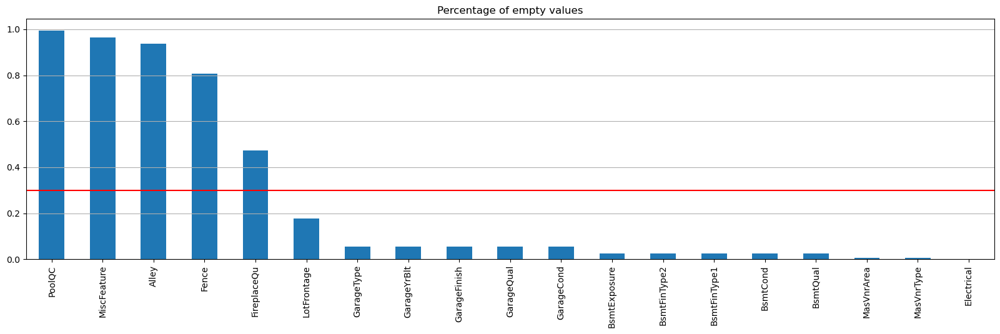

In [605]:
# Percentage of empty values
plt.figure(figsize=(20,5))
data[vars_with_na].isnull().mean().sort_values(ascending=False).plot.bar()
plt.axhline(y = 0.3, color = 'r')
plt.title('Percentage of empty values')
plt.grid(axis='y')
plt.show()

### Conclusion:
    - we will remove all variables that have more than 30 percent empty values, because they carry almost no information, but only create noise.

In [606]:
# Observing features in our data
numerical = [var for var in data.columns if data[var].dtype != 'O' and var != 'SalePrice']
discrete = [var for var in data.columns if data[var].dtype != 'O' and var != 'SalePrice' and var != 'YrSold' and data[var].nunique() < 20]
continuous = [var for var in data.columns if data[var].dtype != 'O' and var != 'SalePrice' and var not in discrete
             and var != 'Id' and var != 'YrSold']
categorical = [var for var in data.columns if data[var].dtype == 'O'
              and var not in ['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']]

print(f'There are numerical variables in our dataset: {len(numerical)}')
print(f'There are discrete variables in our dataset: {len(discrete)}') 
print(f'There are continuous variables in our dataset: {len(continuous)}') 
print(f'There are categorical variables in our dataset: {len(categorical)}')
     

There are numerical variables in our dataset: 37
There are discrete variables in our dataset: 14
There are continuous variables in our dataset: 21
There are categorical variables in our dataset: 38


Text(0, 0.5, 'Number of different categories')

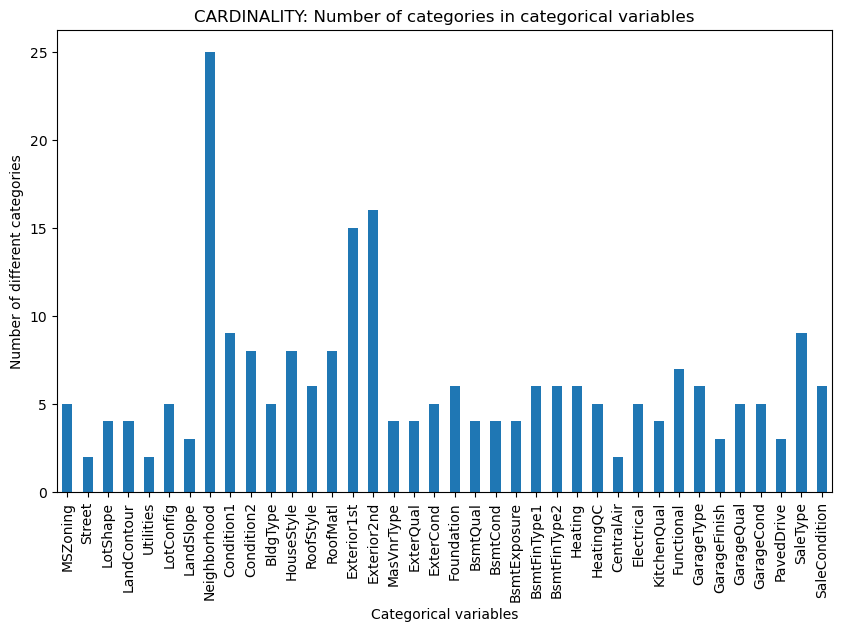

In [607]:
# observe the cardinality of our variable categories
data[categorical].nunique().plot.bar(figsize = (10, 6))
plt.title('CARDINALITY: Number of categories in categorical variables')
plt.xlabel('Categorical variables')
plt.ylabel('Number of different categories')

### Conclusion:
    -we observe that there are variables with high cardinality

In [608]:
# Observing datetime features 
year_vars = [var for var in numerical if 'Yr' in var or 'Year' in var]

print(f"In data we have daytime features as : {year_vars}")

In data we have daytime features as : ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']


In [609]:
data[['YearRemodAdd', 'GarageYrBlt', 'YearBuilt', 'YrSold']].head(20)

,YearRemodAdd,GarageYrBlt,YearBuilt,YrSold
0,2003,2003.0,2003,2008
1,1976,1976.0,1976,2007
2,2002,2001.0,2001,2008
3,1970,1998.0,1915,2006
4,2000,2000.0,2000,2008
5,1995,1993.0,1993,2009
6,2005,2004.0,2004,2007
7,1973,1973.0,1973,2009
8,1950,1931.0,1931,2008
9,1950,1939.0,1939,2008


In [610]:
for col in ['YearRemodAdd', 'GarageYrBlt', 'YearBuilt', 'YrSold']:
    data = elapsed_year(data, col)

In [611]:
data[['YearRemodAdd', 'GarageYrBlt', 'YearBuilt']].head()

,YearRemodAdd,GarageYrBlt,YearBuilt
0,5,5.0,5
1,31,31.0,31
2,6,7.0,7
3,36,8.0,91
4,8,8.0,8


### Conclusion:
    -the YrSold variable will be removed because it correlates with other datetime variables

## Correlation

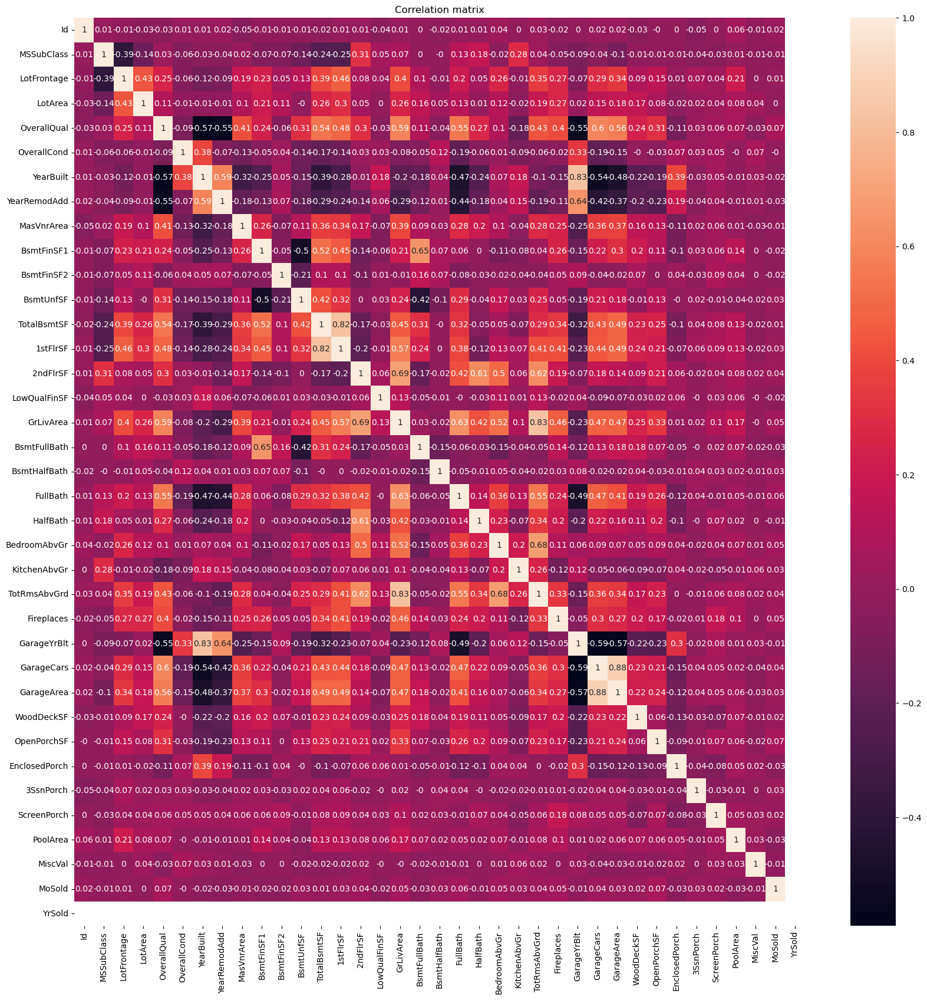

In [612]:
# looking at correlated variables
plt.figure(figsize=(20,20))
sns.heatmap(data[numerical].corr().round(2),annot=True)
plt.title('Correlation matrix')
plt.show()

#### Conclusion:
    - this table shows that we have correlated variables

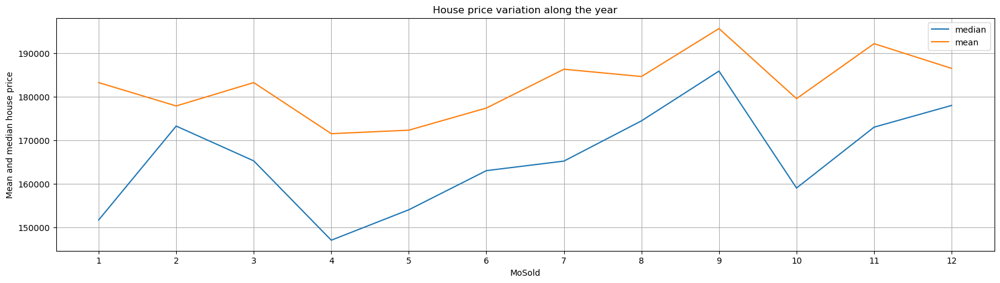

In [613]:
## See how the cost of houses changes depending of the time of year
data.groupby('MoSold')['SalePrice'].agg(['median', 'mean']).plot(figsize = (20,5))
plt.title('House price variation along the year')
plt.ylabel('Mean and median house price')
plt.grid(axis='both')
plt.xticks(np.arange(1,13,1))
plt.show()

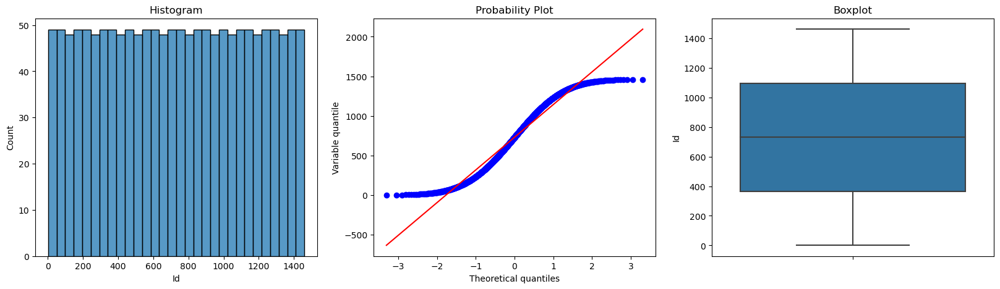

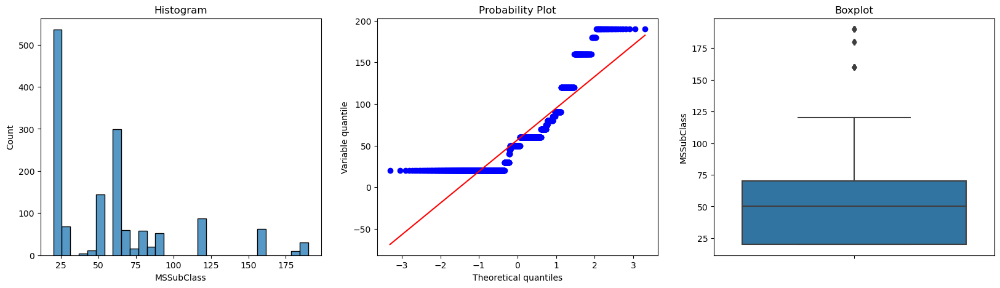

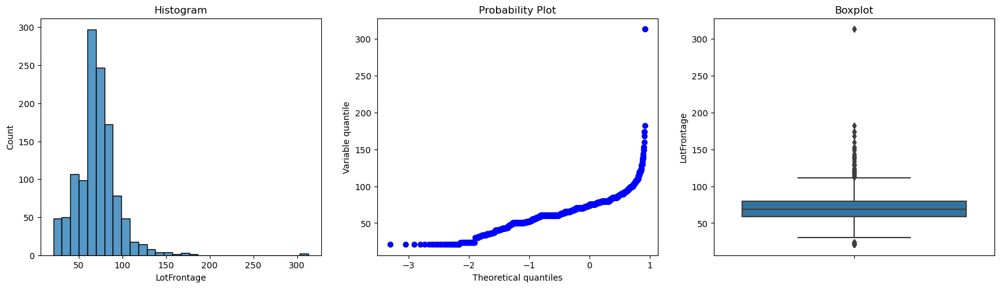

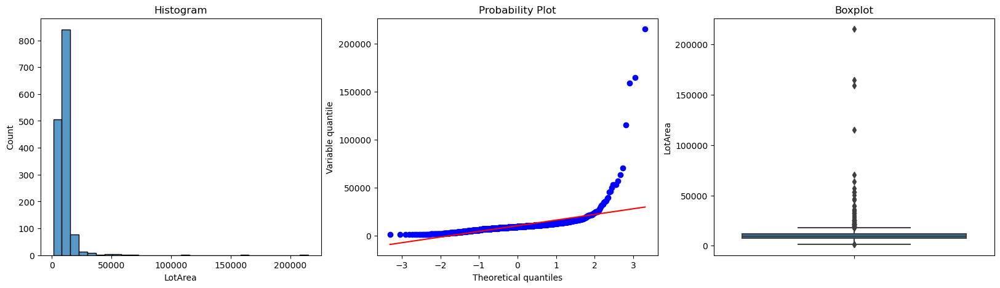

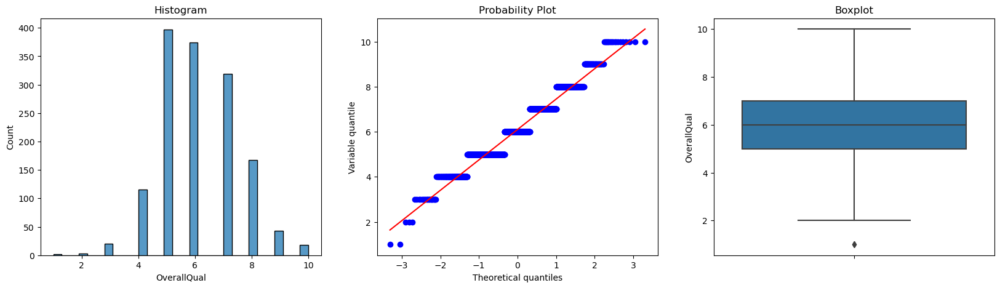

...

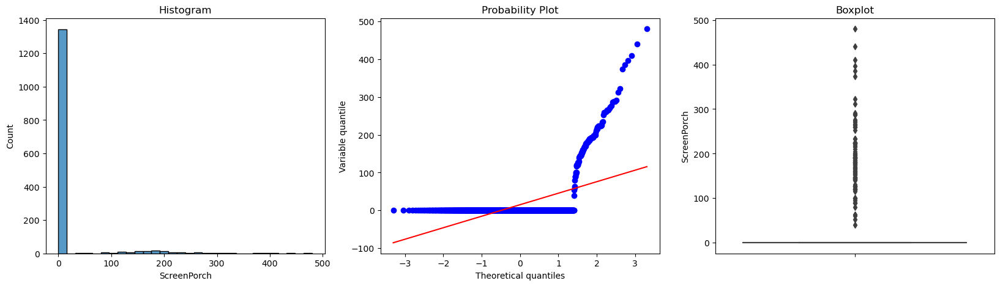

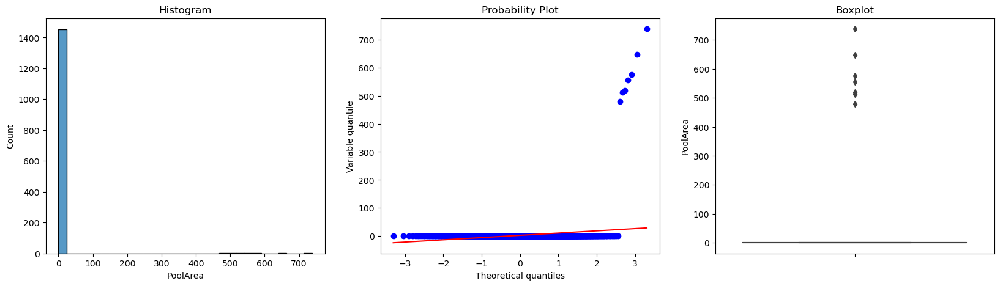

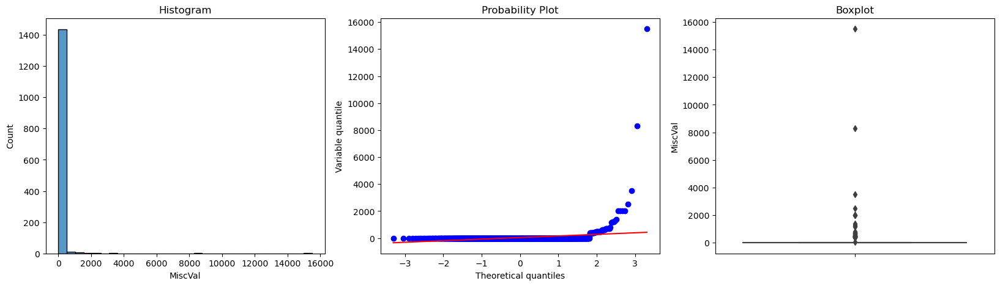

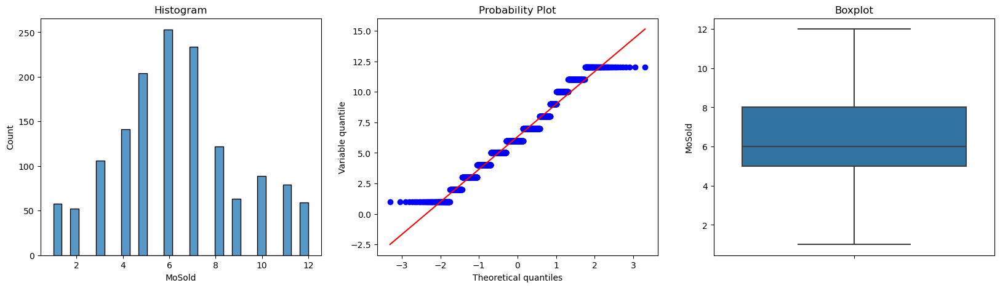

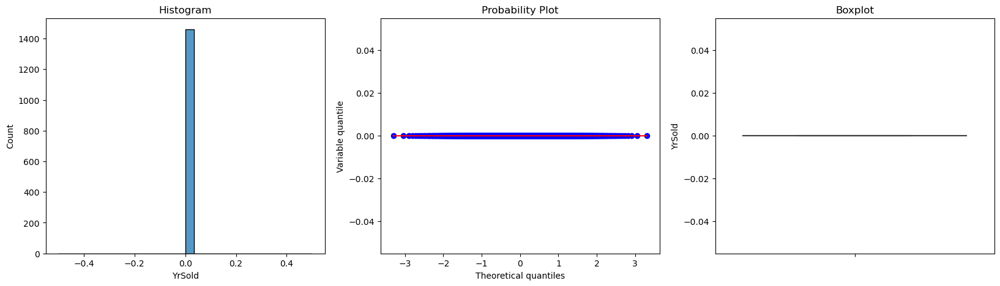

In [614]:
# Outliers and distributions of numerical variables
for col in data[numerical]:
    diagnostic_plot(data, col)

#### Conclusion: 
    - here we see that there are outliers in the numerical variables and the distribution is not symmetrical

In [615]:
## Determine dominants in category variables
vars_with_dominant = list()
for col in data.columns:
    tmp_df = pd.DataFrame(data[col].value_counts() / len(data)).reset_index()
    tmp_df.columns = [col, 'percentage']
    tmp_df.percentage = tmp_df.percentage.round(3)
    if tmp_df.iloc[0].percentage > 0.85:
        vars_with_dominant.append(tmp_df.columns[0])
        print(f'{tmp_df.columns[0]} have dominant label')
    else:
        pass

Street have dominant label
LandContour have dominant label
Utilities have dominant label
LandSlope have dominant label
Condition1 have dominant label
Condition2 have dominant label
RoofMatl have dominant label
ExterCond have dominant label
BsmtCond have dominant label
BsmtFinType2 have dominant label
BsmtFinSF2 have dominant label
Heating have dominant label
CentralAir have dominant label
Electrical have dominant label
LowQualFinSF have dominant label
BsmtHalfBath have dominant label
KitchenAbvGr have dominant label
Functional have dominant label
GarageQual have dominant label
GarageCond have dominant label
PavedDrive have dominant label
EnclosedPorch have dominant label
3SsnPorch have dominant label
ScreenPorch have dominant label
PoolArea have dominant label
MiscVal have dominant label
YrSold have dominant label
SaleType have dominant label


In [828]:
data[vars_with_dominant]

,Street,LandContour,Utilities,LandSlope,Condition1,Condition2,RoofMatl,ExterCond,BsmtCond,BsmtFinType2,BsmtFinSF2,Heating,CentralAir,Electrical,LowQualFinSF,BsmtHalfBath,KitchenAbvGr,Functional,GarageQual,GarageCond,PavedDrive,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SaleType
0,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,TA,TA,Unf,0,GasA,Y,SBrkr,0,0,1,Typ,TA,TA,Y,0,0,0,0,0,0,WD
1,Pave,Lvl,AllPub,Gtl,Feedr,Norm,CompShg,TA,TA,Unf,0,GasA,Y,SBrkr,0,1,1,Typ,TA,TA,Y,0,0,0,0,0,0,WD
2,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,TA,TA,Unf,0,GasA,Y,SBrkr,0,0,1,Typ,TA,TA,Y,0,0,0,0,0,0,WD
3,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,TA,Gd,Unf,0,GasA,Y,SBrkr,0,0,1,Typ,TA,TA,Y,272,0,0,0,0,0,WD
4,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,TA,TA,Unf,0,GasA,Y,SBrkr,0,0,1,Typ,TA,TA,Y,0,0,0,0,0,0,WD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,TA,TA,Unf,0,GasA,Y,SBrkr,0,0,1,Typ,TA,TA,Y,0,0,0,0,0,0,WD
1456,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,TA,TA,Rec,163,GasA,Y,SBrkr,0,0,1,Min1,TA,TA,Y,0,0,0,0,0,0,WD
1457,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,Gd,Gd,Unf,0,GasA,Y,SBrkr,0,0,1,Typ,TA,TA,Y,0,0,0,0,2500,0,WD
1458,Pave,Lvl,AllPub,Gtl,Norm,Norm,CompShg,TA,TA,Rec,1029,GasA,Y,FuseA,0,0,1,Typ,TA,TA,Y,112,0,0,0,0,0,WD


In [616]:
vars_without_dominant = [
    var for var in categorical if var not in vars_with_dominant 
] 
vars_without_dominant

['MSZoning',
 'LotShape',
 'LotConfig',
 'Neighborhood',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'Foundation',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinType1',
 'HeatingQC',
 'KitchenQual',
 'GarageType',
 'GarageFinish',
 'SaleCondition']

In [617]:
## Calculate the average number of houses and the cost of houses in each category
tmp_df = calculate_mean_target_per_category(data, 'GarageCond')
tmp_df

,GarageCond,perc_houses,SalePrice
0,TA,0.908219,187885.735294
1,Fa,0.023973,114654.028571
2,Gd,0.006164,179930.000000
3,Po,0.004795,108500.000000
4,Ex,0.001370,124000.000000


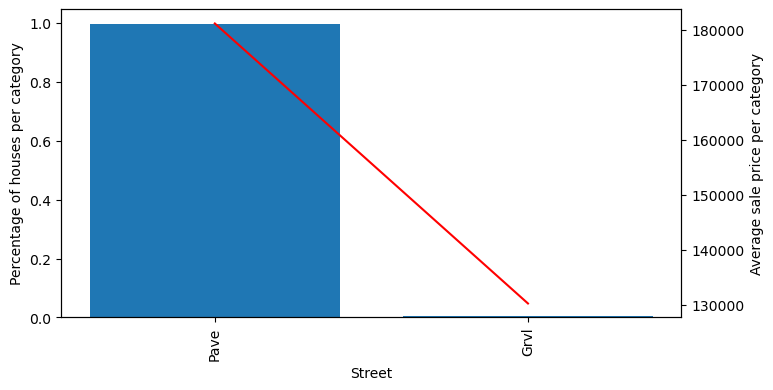

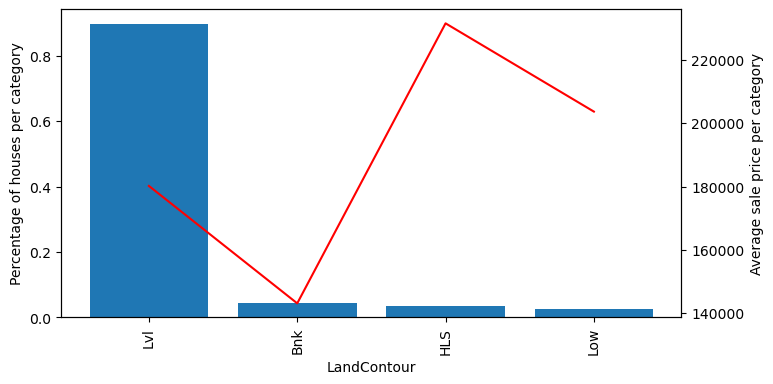

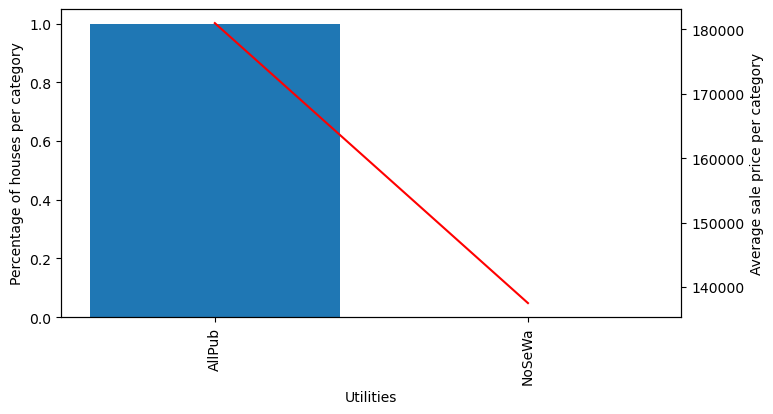

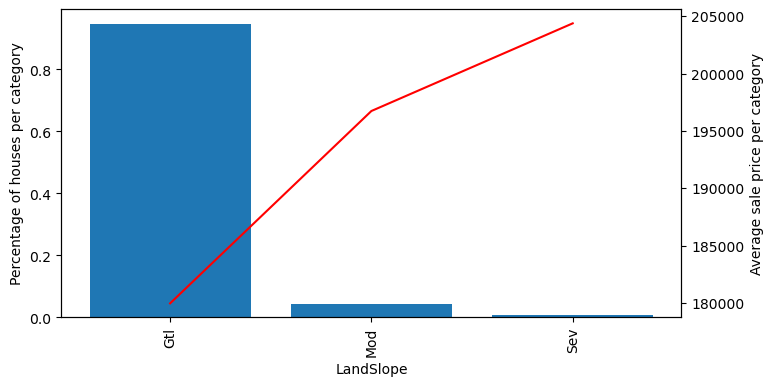

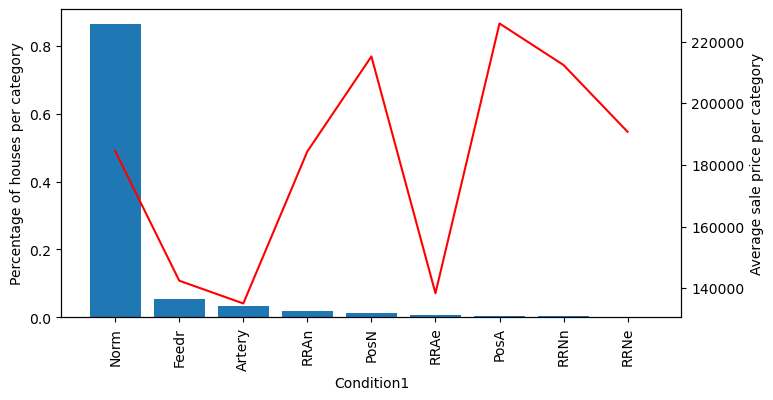

...

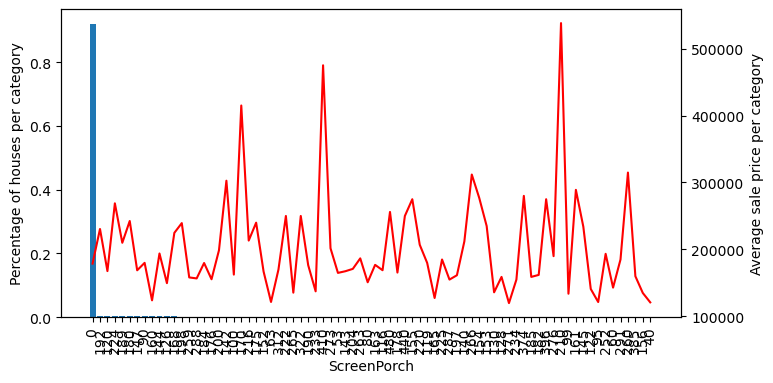

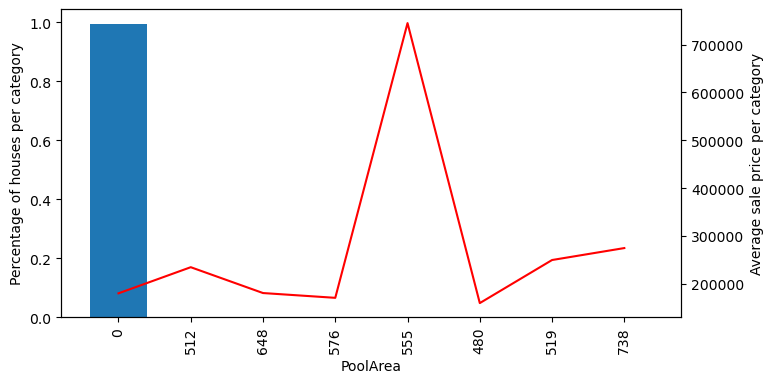

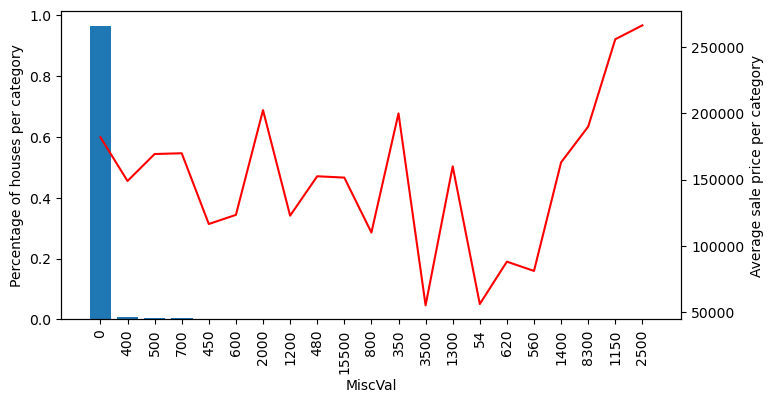

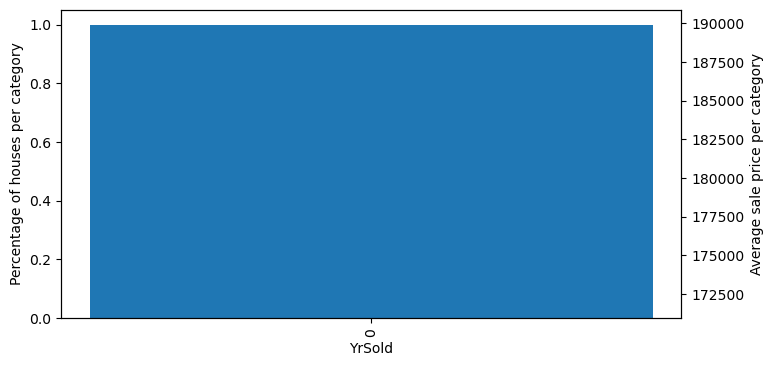

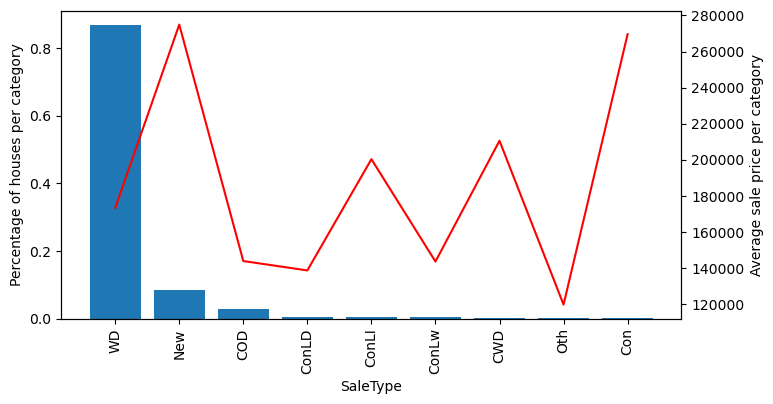

In [618]:
#draw graphs to view the number of houses and the cost in each label of variable
for col in data[vars_with_dominant]:
    tmp_df = calculate_mean_target_per_category(data, col)
    plot_categories(tmp_df, col)

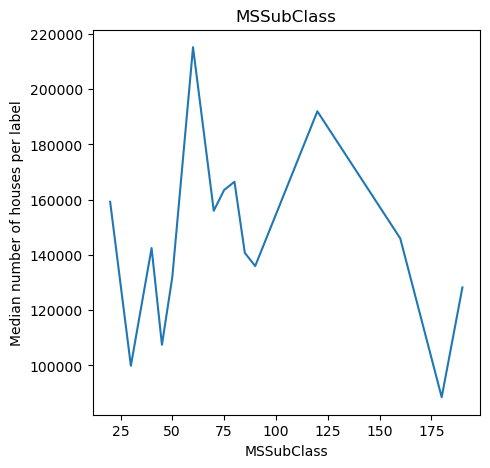

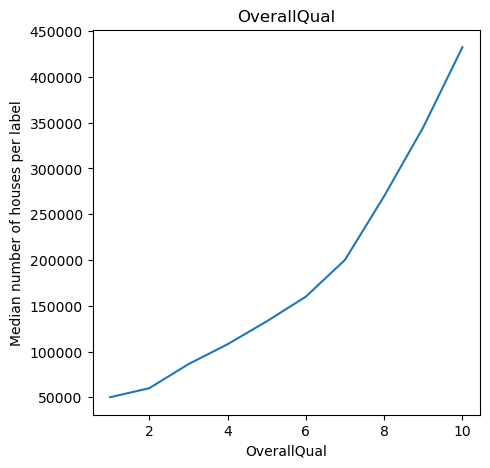

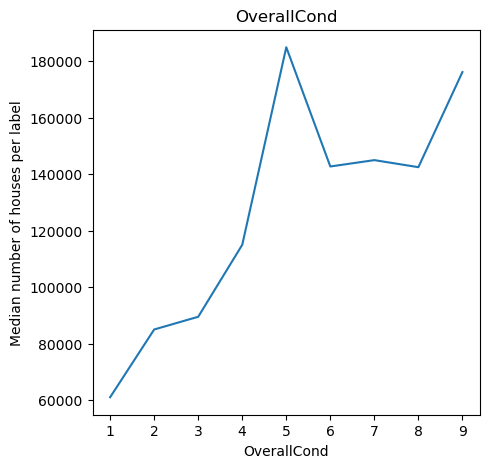

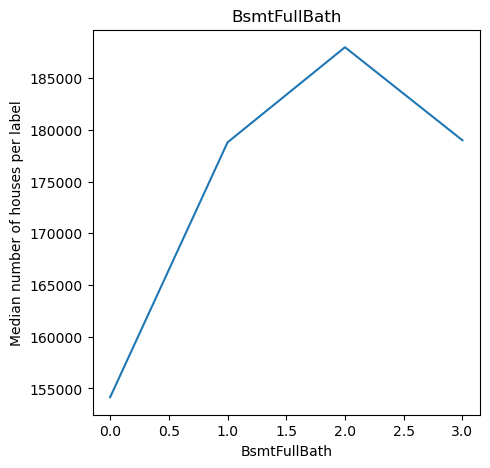

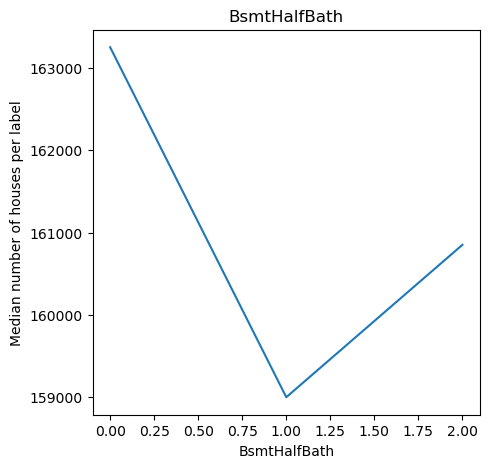

...

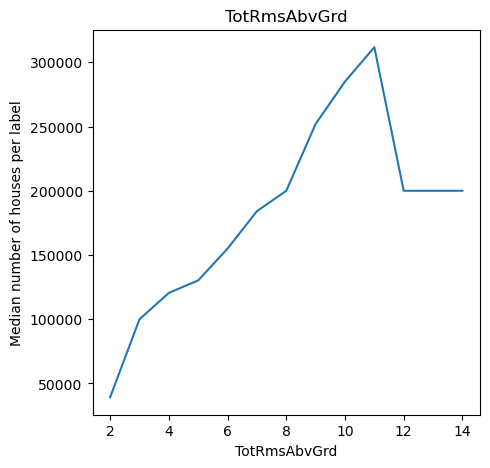

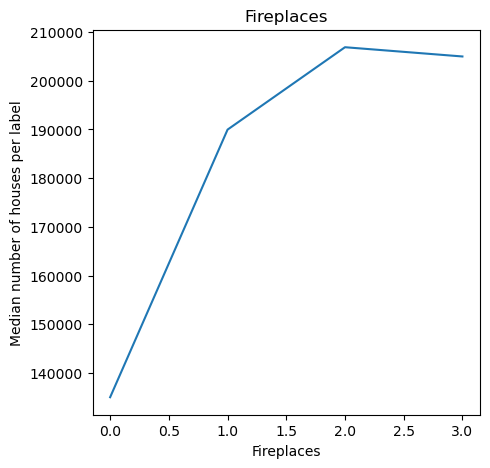

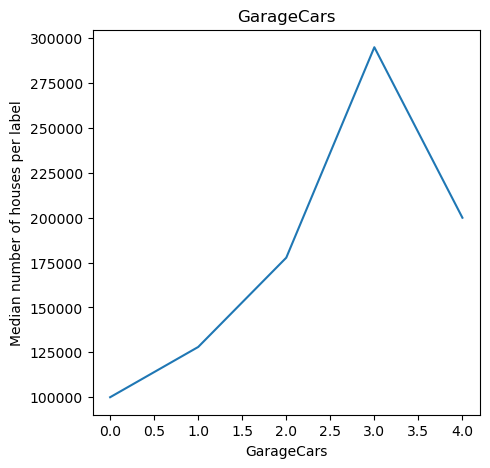

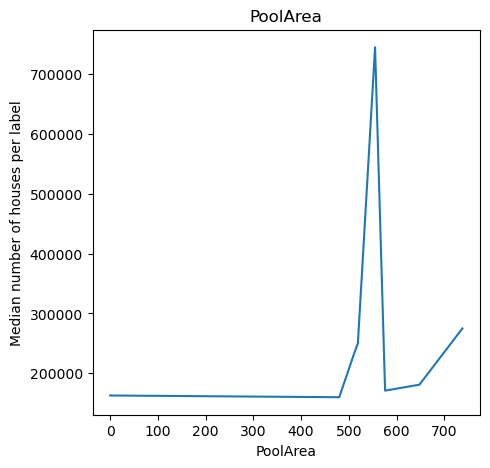

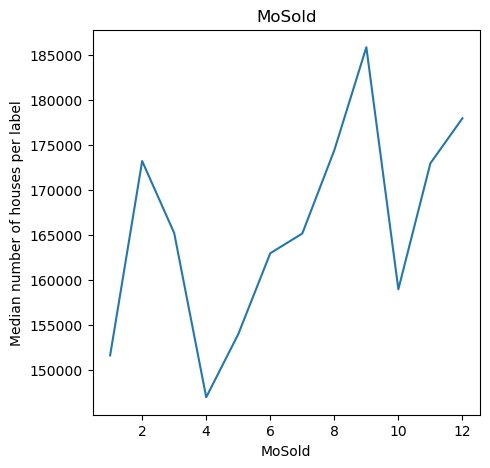

In [619]:
## Monotonic relationship between discrete variables and target
for var in discrete:
    data.groupby([var])['SalePrice'].median().plot(figsize = (5,5))
    plt.ylabel('Median number of houses per label')
    plt.title(var)
    plt.show()

### Conclusion:
    - - here we see that the ratios are not monotonic except for some variables

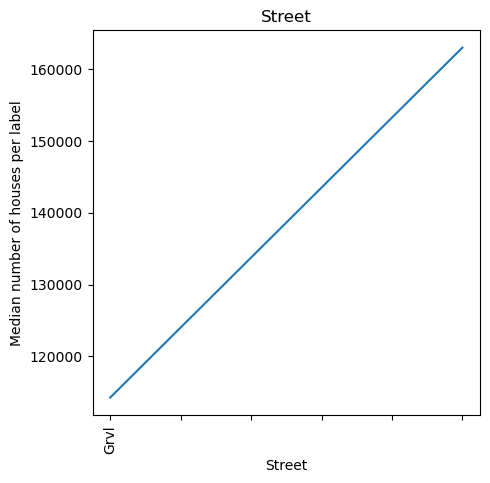

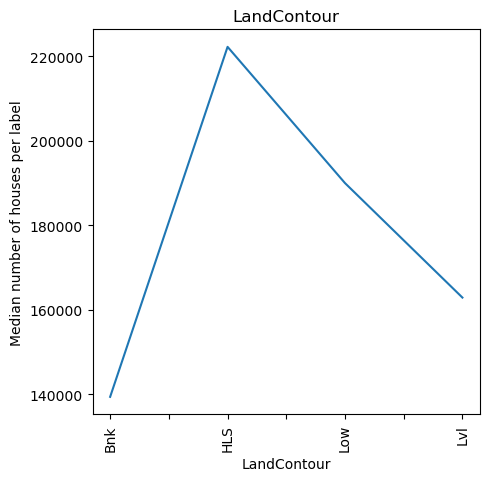

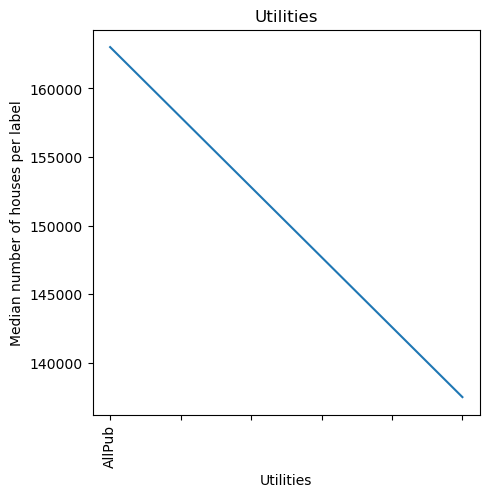

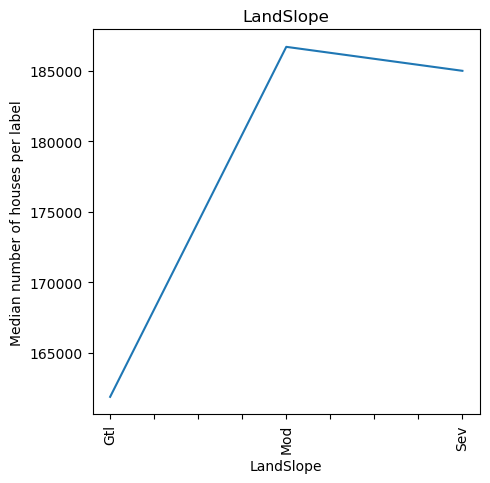

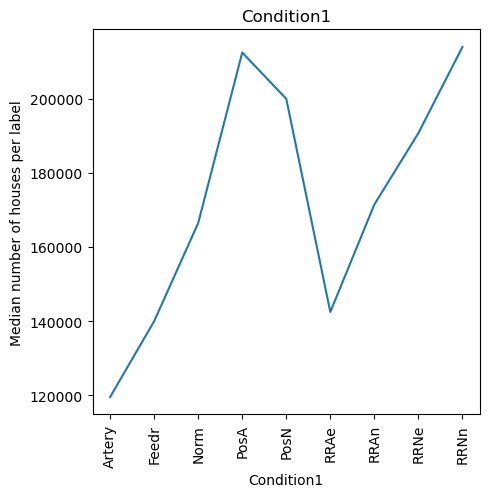

...

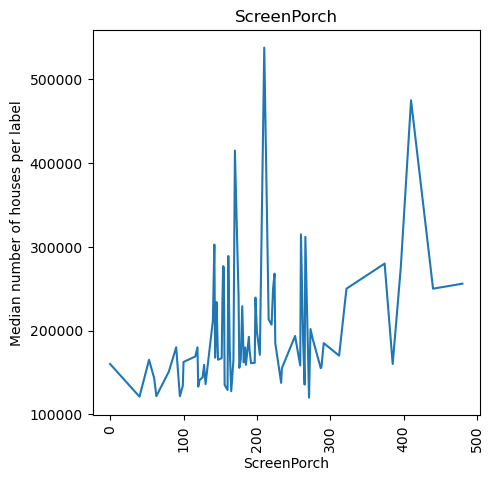

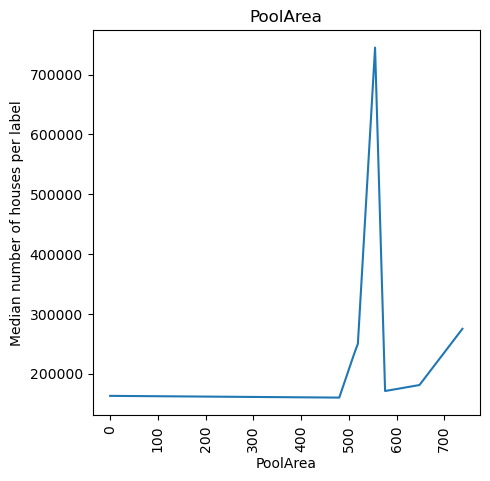

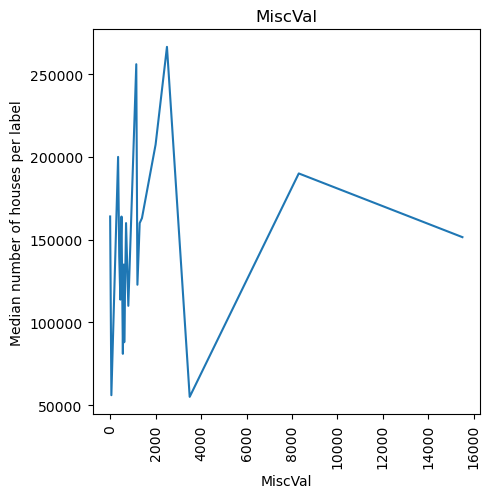

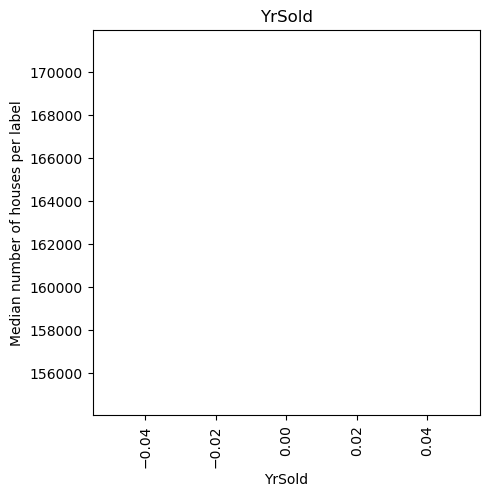

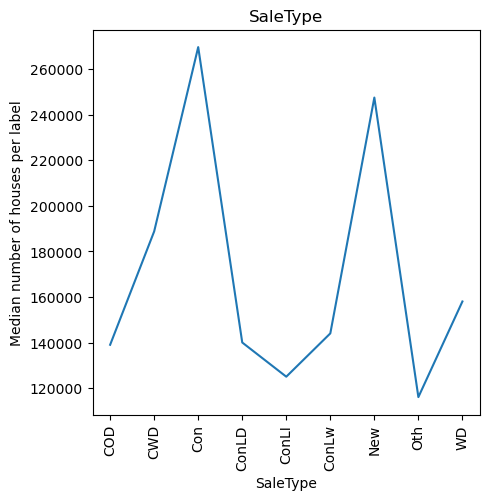

In [620]:
## Monotonic relationship between categorical variables and target
for var in vars_with_dominant:
    data.groupby([var])['SalePrice'].median().plot(figsize = (5,5))
    plt.ylabel('Median number of houses per label')
    plt.title(var)
    plt.xticks(rotation = 90)
    plt.show()

### Conclusion:
    - here we see that the ratios are not monotonic except for some variables

## Imputation of numerical variables

In [621]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels = ['SalePrice'], axis = 1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0
)

X_train.shape, X_test.shape

((1022, 80), (438, 80))

In [622]:
X_train.drop(labels=['Id', 'YrSold', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1, inplace=True)
X_test.drop(labels=['Id', 'YrSold', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1, inplace=True)

In [623]:
X_train[continuous].isnull().mean().sort_values(ascending = False)

LotFrontage      0.184932
GarageYrBlt      0.052838
MasVnrArea       0.004892
LowQualFinSF     0.000000
ScreenPorch      0.000000
3SsnPorch        0.000000
EnclosedPorch    0.000000
OpenPorchSF      0.000000
WoodDeckSF       0.000000
GarageArea       0.000000
GrLivArea        0.000000
2ndFlrSF         0.000000
LotArea          0.000000
1stFlrSF         0.000000
TotalBsmtSF      0.000000
BsmtUnfSF        0.000000
BsmtFinSF2       0.000000
BsmtFinSF1       0.000000
YearRemodAdd     0.000000
YearBuilt        0.000000
MiscVal          0.000000
dtype: float64

In [624]:
num_var_null = X_train[continuous].isnull().mean().sort_values(ascending=False)[:3].index
num_var_null

Index(['LotFrontage', 'GarageYrBlt', 'MasVnrArea'], dtype='object')

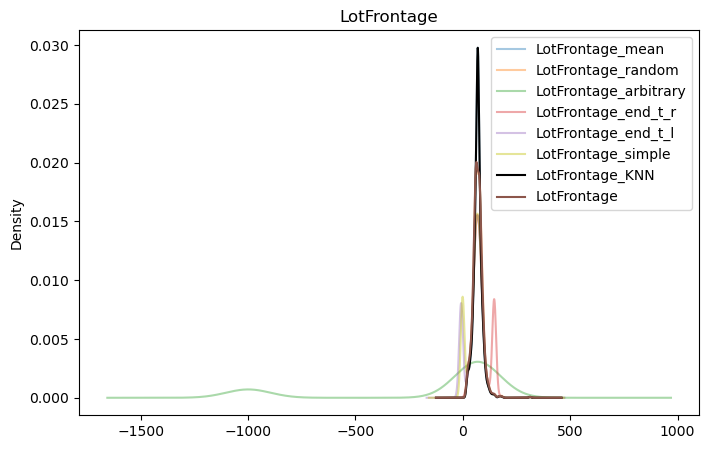

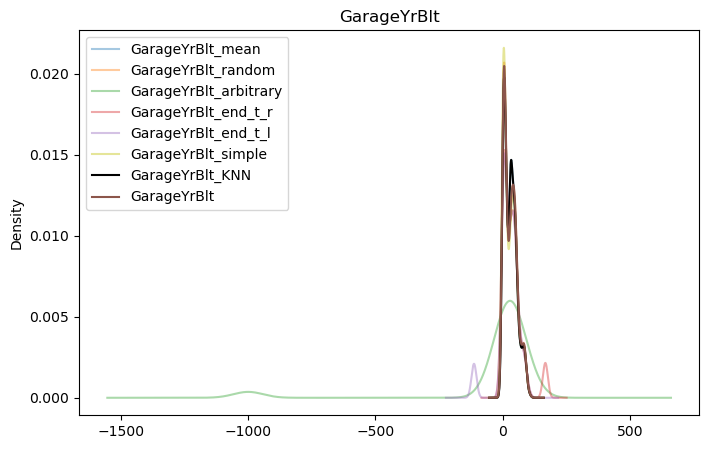

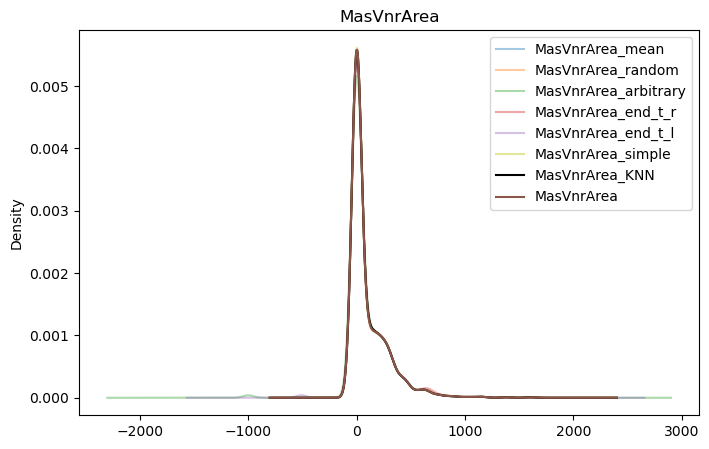

In [625]:
# draw graphs to see the change in the distribution of variables after replacing empty values
for var in num_var_null:
    imputed_vars(X_train, var)

#### Conclusion: 
    - Looking at these graphs, I came to the conclusion that I need to use a simple imputer to replace empty values ​​in numeric variables, because after the replacement, the distribution does not change so much.  Of course, the random sample imputer is best suited, but when training algorithms, it will produce different values ​​each time.

In [626]:
#find category variables with empty values
X_train[vars_without_dominant].isnull().mean().sort_values(ascending=False)

GarageFinish     0.052838
GarageType       0.052838
BsmtFinType1     0.023483
BsmtExposure     0.023483
BsmtQual         0.023483
MasVnrType       0.004892
MSZoning         0.000000
Foundation       0.000000
KitchenQual      0.000000
HeatingQC        0.000000
ExterQual        0.000000
LotShape         0.000000
Exterior2nd      0.000000
Exterior1st      0.000000
RoofStyle        0.000000
HouseStyle       0.000000
BldgType         0.000000
Neighborhood     0.000000
LotConfig        0.000000
SaleCondition    0.000000
dtype: float64

In [627]:
cat_vars = X_train[vars_without_dominant].isnull().mean().sort_values(ascending=False)[:6].index
cat_vars 

Index(['GarageFinish', 'GarageType', 'BsmtFinType1', 'BsmtExposure',
       'BsmtQual', 'MasVnrType'],
      dtype='object')

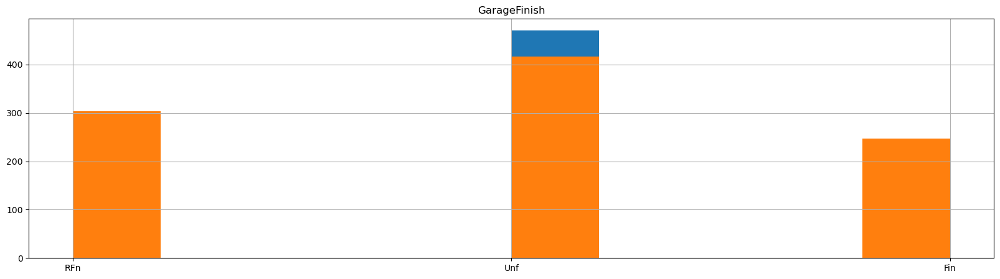

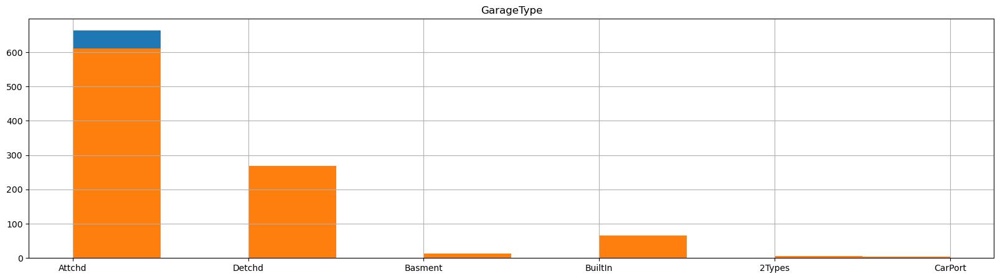

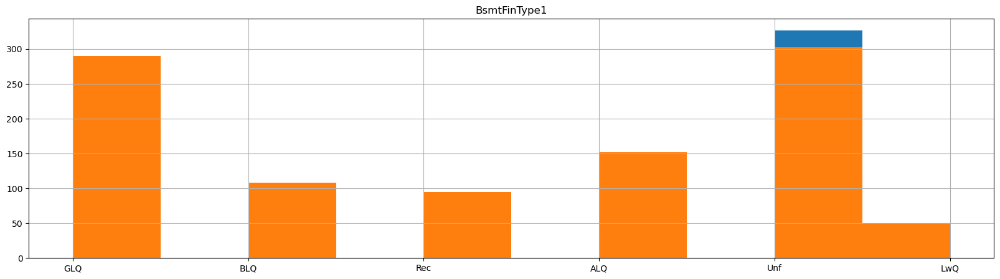

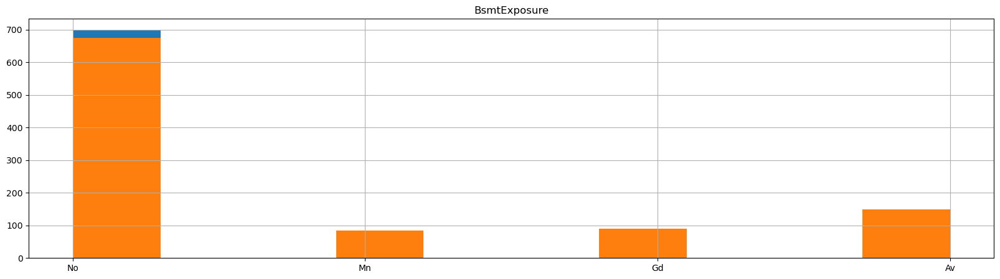

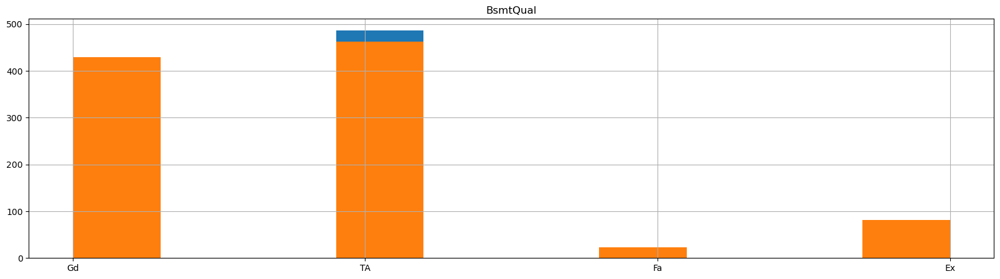

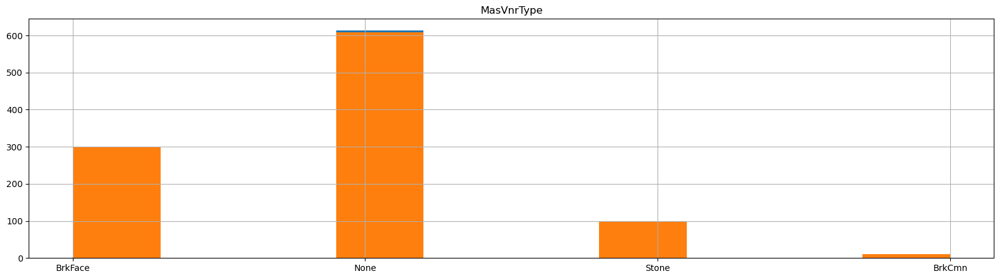

In [628]:
for col in cat_vars:
    imputed_cat_var(X_train, col)

#### Conclusion: 
    - When replacing empty values ​​in category variables, I decided to use the most frequent label replacement method, since the missing value replacement method adds another missing label, which changes the distribution much more after replacing empty values.

In [629]:
## Encoding of categorical variables
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels = ['SalePrice'], axis = 1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0
)

X_train.shape, X_test.shape

((1022, 80), (438, 80))

In [630]:
imputer = CategoricalImputer(imputation_method='frequent')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

In [631]:
# we see those variables to which the imputer is applied
imputer.variables_

['MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition']

In [632]:
# replace empty values ​​in numeric variables
impute_num = MeanMedianImputer(imputation_method='median', variables=numerical)
X_train = impute_num.fit_transform(X_train)
X_test = impute_num.transform(X_test)

In [633]:
# rare label coding
re = RareLabelEncoder(tol=0.05, variables=vars_without_dominant)
X_train = re.fit_transform(X_train)
X_test = re.transform(X_test)

In [634]:
#check unique values ​​in training and test sets
for col in vars_without_dominant:
    if X_train[col].nunique() > X_test[col].nunique():
        print(col)
        for label in X_train[col].unique():
            if label not in X_test[col].unique():
                print(f"Test {col} dont have {label} ")
        
    if X_train[col].nunique() < X_test[col].nunique():
        print(col)
        for label in X_test[col].unique():
            if label not in X_train[col].unique():
                print(f"Train {col} dont have {label} ")
    else:
        pass

RoofStyle
Test RoofStyle dont have Shed 
HeatingQC
Test HeatingQC dont have Po 
GarageType
Test GarageType dont have 2Types 


In [635]:
print(X_train.isnull().sum())
print(X_test.isnull().sum())

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 80, dtype: int64
Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 80, dtype: int64


#### Conclusion:
    - as you can see there are no unique values ​​in both sets

In [636]:
X_train_ohe = X_train.copy()
X_test_ohe = X_test.copy()

X_train_mean = X_train.copy()
X_test_mean = X_test.copy()

X_train_count = X_train.copy()
X_test_count = X_test.copy()

X_train_ordered = X_train.copy()
X_test_ordered = X_test.copy()

In [637]:
OHE_enc = OneHotEncoder(drop_last=True)
X_train_ohe = OHE_enc.fit_transform(X_train_ohe)
X_test_ohe = OHE_enc.transform(X_test_ohe)

In [638]:
mean_enc = MeanEncoder()
X_train_mean = mean_enc.fit_transform(X_train_mean, y_train)
X_test_mean = mean_enc.transform(X_test_mean)

In [639]:
count_enc = CountFrequencyEncoder(encoding_method='count')
X_train_count = count_enc.fit_transform(X_train_count)
X_test_count = count_enc.transform(X_test_count)

In [640]:
ordered_enc = OrdinalEncoder(encoding_method='ordered')
X_train_ordered = ordered_enc.fit_transform(X_train_ordered, y_train)
X_test_ordered = ordered_enc.transform(X_test_ordered)

In [641]:
scaler = StandardScaler()
scaler.fit_transform(X_train_count)
scaler.fit_transform(X_train_mean)
scaler.fit_transform(X_train_ordered)

scaler.transform(X_test_count)
scaler.transform(X_test_mean)
scaler.transform(X_test_ordered)

array([[-0.47721475, -0.86887966,  0.36042849, ...,  0.        ,
        -0.20501057,  1.23496775],
       [-0.56739362, -0.1569649 ,  0.36042849, ...,  0.        ,
        -0.20501057, -0.00851702],
       [-0.64333373, -0.1569649 ,  0.36042849, ...,  0.        ,
        -0.20501057, -0.00851702],
       ...,
       [-0.1805737 , -0.86887966,  0.36042849, ...,  0.        ,
        -0.20501057, -0.00851702],
       [ 1.30500464, -0.86887966,  0.36042849, ...,  0.        ,
        -0.20501057, -0.00851702],
       [ 0.39846961, -0.86887966,  0.36042849, ...,  0.        ,
         3.08589211,  2.47845251]])


## Conclusion section

In [642]:
def run_linear_regression(X_train, X_test, y_train, y_test):
    
    reg = LinearRegression()
    reg.fit(X_train, y_train)
    
    print('Train set')
    train_pred = reg.predict(X_train)
    print('Linear regression r2: {}'.format(r2_score(y_train, train_pred)))
    print('Test set')
    test_pred = reg.predict(X_test)
    print('Linear regression r2: {}'.format(r2_score(y_test, test_pred)))

In [643]:
def run_decision_tree_regressor(X_train, X_test, y_train, y_test):
    regressor = DecisionTreeRegressor(max_depth=4)
    regressor.fit(X_train, y_train)
    print('Train set')
    train_pred = regressor.predict(X_train)
    print('Decision tree regressor r2: {}'.format(r2_score(y_train, train_pred)))
    print('Test set')
    test_pred = regressor.predict(X_test)
    print('Decision tree regressor r2: {}'.format(r2_score(y_test, test_pred)))

In [644]:
def run_random_forest(X_train, X_test, y_train, y_test):
    reg = RandomForestRegressor(n_estimators=100, criterion='poisson')
    reg.fit(X_train, y_train)
    print('Train set')
    train_pred = reg.predict(X_train)
    print('Random forest regression r2: {}'.format(r2_score(y_train, train_pred)))
    print('Test set')
    test_pred = reg.predict(X_test)
    print('Random forest regression r2: {}'.format(r2_score(y_test, test_pred)))

In [645]:
# def run_SVR(X_train, X_test, y_train, y_test):
#     reg = SVR(kernel = 'poly', gamma = 'auto')
#     reg.fit(X_train, y_train)
#     print('Train set')
#     train_pred = reg.predict(X_train)
#     print('SVR r2: {}'.format(r2_score(y_train, train_pred)))
#     print('Test set')
#     test_pred = reg.predict(X_test)
#     print('SVR r2: {}'.format(r2_score(y_test, test_pred)))

In [646]:
def run_xgboost(X_train, X_test, y_train, y_test):
    reg = XGBRFRegressor()
    reg.fit(X_train, y_train)
    print('Train set')
    train_pred = reg.predict(X_train)
    print('XGBoost regressor r2: {}'.format(r2_score(y_train, train_pred)))
    print('Test set')
    test_pred = reg.predict(X_test)
    print('XGBoost regressor r2: {}'.format(r2_score(y_test, test_pred)))

In [647]:
def run_KNeighbors(X_train, X_test, y_train, y_test):
    reg = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='auto', p=2, metric='minkowski')
    reg.fit(X_train, y_train)
    print('Train set')
    train_pred = reg.predict(X_train)
    print('KNeighbors regressor r2: {}'.format(r2_score(y_train, train_pred)))
    print('Test set')
    test_pred = reg.predict(X_test)
    print('KNeighbors regressor r2: {}'.format(r2_score(y_test, test_pred)))

## Linear regression

In [648]:
print(X_test_mean.isnull().sum())
print(X_train_mean.isnull().sum())

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 80, dtype: int64
Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 80, dtype: int64


In [649]:
X_train_mean = impute_num.fit_transform(X_train_mean)
X_train_count = impute_num.fit_transform(X_train_count)
X_train_ordered = impute_num.fit_transform(X_train_ordered)

In [650]:
X_test_mean = impute_num.transform(X_test_mean)
X_test_mean = X_test_mean.fillna(-1)

X_test_count = impute_num.transform(X_test_count)
X_test_count = X_test_count.fillna(-1)

X_test_ordered = impute_num.transform(X_test_ordered)
X_test_ordered = X_test_ordered.fillna(-1)

In [652]:
print(X_test_mean.isnull().sum())

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 80, dtype: int64


## Linear Regression

In [653]:
run_linear_regression(X_train_mean, X_test_mean, y_train, y_test)

Train set
Linear regression r2: 0.8845399100014846
Test set
Linear regression r2: 0.6606831143605455


In [654]:
run_linear_regression(X_train_count, X_test_count, y_train, y_test)

Train set
Linear regression r2: 0.8866092000881899
Test set
Linear regression r2: 0.706707978979302


In [655]:
run_linear_regression(X_train_ohe, X_test_ohe, y_train, y_test)

Train set
Linear regression r2: 0.9394595970727188
Test set
Linear regression r2: 0.6021397269577629


In [656]:
run_linear_regression(X_train_ordered, X_test_ordered, y_train, y_test)

Train set
Linear regression r2: 0.8779110176609225
Test set
Linear regression r2: 0.6891420612231784


## Decision tree regression

In [657]:
run_decision_tree_regressor(X_train_count, X_test_count, y_train, y_test )

Train set
Decision tree regressor r2: 0.8165186619239118
Test set
Decision tree regressor r2: 0.7831002783051572


In [658]:
run_decision_tree_regressor(X_train_mean, X_test_mean, y_train, y_test)

Train set
Decision tree regressor r2: 0.8165517895749945
Test set
Decision tree regressor r2: 0.7791201567311979


In [659]:
run_decision_tree_regressor(X_train_ohe, X_test_ohe, y_train, y_test)

Train set
Decision tree regressor r2: 0.8165186619239118
Test set
Decision tree regressor r2: 0.7560878701890758


In [660]:
run_decision_tree_regressor(X_train_ordered, X_test_ordered, y_train, y_test)

Train set
Decision tree regressor r2: 0.8165517895749945
Test set
Decision tree regressor r2: 0.7404465521558676


## Random forest regression

In [661]:
run_random_forest(X_train_count, X_test_count, y_train, y_test)

Train set
Random forest regression r2: 0.9797812849711312
Test set
Random forest regression r2: 0.8589956160040605


In [662]:
run_random_forest(X_train_mean, X_test_mean, y_train, y_test)

Train set
Random forest regression r2: 0.9784866059428072
Test set
Random forest regression r2: 0.8633659061421896


In [663]:
run_random_forest(X_train_ohe, X_test_ohe, y_train, y_test)

Train set
Random forest regression r2: 0.9788382376024931
Test set
Random forest regression r2: 0.8664273360132609


In [664]:
run_random_forest(X_train_ordered, X_test_ordered, y_train, y_test)

Train set
Random forest regression r2: 0.9803962100553449
Test set
Random forest regression r2: 0.8640457915964918


## KNeighbors regression

In [665]:
run_KNeighbors(X_train_count, X_test_count, y_train, y_test)

Train set
KNeighbors regressor r2: 1.0
Test set
KNeighbors regressor r2: 0.7059764149463442


In [666]:
run_KNeighbors(X_train_ohe, X_test_ohe, y_train, y_test)

Train set
KNeighbors regressor r2: 1.0
Test set
KNeighbors regressor r2: 0.67156078036223


In [667]:
run_KNeighbors(X_train_ordered, X_test_ordered, y_train, y_test)

Train set
KNeighbors regressor r2: 1.0
Test set
KNeighbors regressor r2: 0.6715619879057131


In [668]:
run_KNeighbors(X_train_mean, X_test_mean, y_train, y_test)

Train set
KNeighbors regressor r2: 0.9999999999999215
Test set
KNeighbors regressor r2: 0.6928535655143162


## XGBoost regression

In [669]:
run_xgboost(X_train_mean, X_test_mean, y_train, y_test)

Train set
XGBoost regressor r2: 0.9511445169097458
Test set
XGBoost regressor r2: 0.8191290273914229


In [670]:
run_xgboost(X_train_count, X_test_count, y_train, y_test)

Train set
XGBoost regressor r2: 0.9487663642801454
Test set
XGBoost regressor r2: 0.8186868856217709


In [671]:
run_xgboost(X_train_ohe, X_test_ohe, y_train, y_test)

Train set
XGBoost regressor r2: 0.9489555904896619
Test set
XGBoost regressor r2: 0.8210445760542571


In [672]:
run_xgboost(X_train_ordered, X_test_ordered, y_train, y_test)

Train set
XGBoost regressor r2: 0.9511472439058062
Test set
XGBoost regressor r2: 0.8189399412465673


## Graph readings for Mean encoder

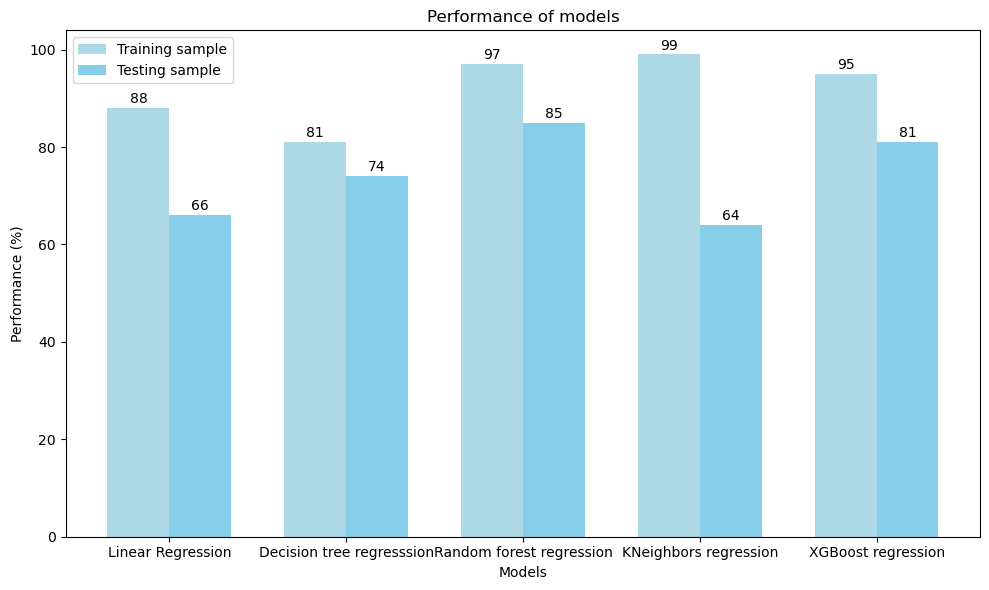

In [673]:
models = ['Linear Regression', 'Decision tree regresssion', 'Random forest regression', 
          'KNeighbors regression', 'XGBoost regression']

X_train_mean_performance = [88, 81, 97, 99, 95]
X_test_mean_performance = [66, 74, 85, 64, 81]

bar_width = 0.35

plt.figure(figsize=(10, 6))

index = range(len(models))

plt.bar(index, X_train_mean_performance, bar_width, color = 'lightblue', label = 'Training sample')

plt.bar([i + bar_width for i in index], X_test_mean_performance, bar_width, color = 'skyblue', label = 'Testing sample')

plt.title('Performance of models')
plt.xlabel('Models')
plt.ylabel('Performance (%)')

plt.xticks([i + bar_width / 2 for i in index], models)

plt.legend()

for i, value in enumerate(X_train_mean_performance):
    plt.text(i, value + 1, str(value), ha = 'center')

for i, value in enumerate(X_test_mean_performance):
    plt.text(i + bar_width, value + 1, str(value), ha = 'center')

plt.tight_layout()
plt.show()

## Graph reading for Count encoder

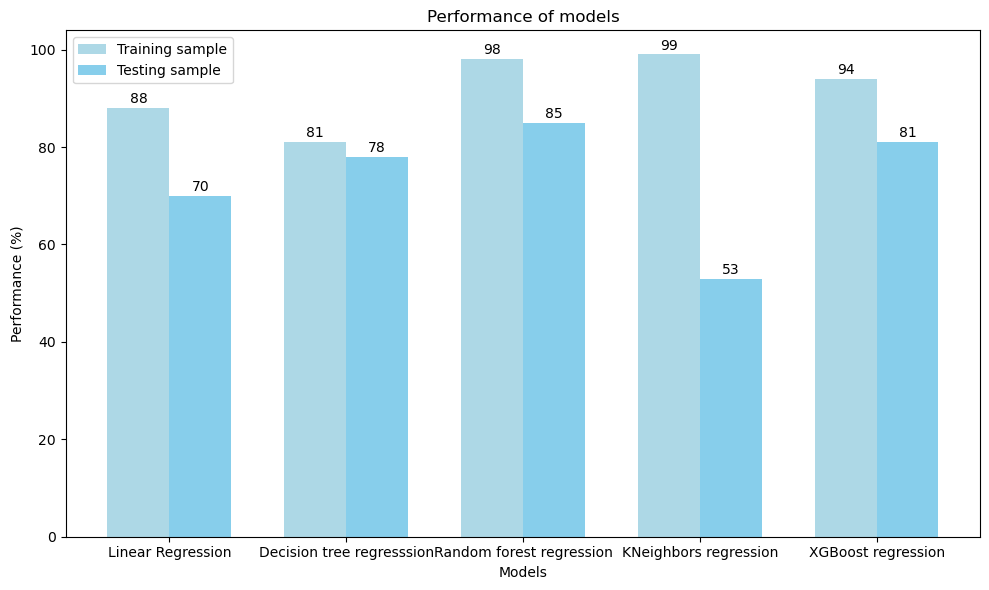

In [674]:
models = ['Linear Regression', 'Decision tree regresssion', 'Random forest regression', 
          'KNeighbors regression', 'XGBoost regression']

X_train_count_performance = [88, 81, 98, 99, 94]
X_test_count_performance = [70, 78, 85, 53, 81]

bar_width = 0.35

plt.figure(figsize=(10, 6))

index = range(len(models))

plt.bar(index, X_train_count_performance, bar_width, color = 'lightblue', label = 'Training sample')

plt.bar([i + bar_width for i in index], X_test_count_performance, bar_width, color = 'skyblue', label = 'Testing sample')

plt.title('Performance of models')
plt.xlabel('Models')
plt.ylabel('Performance (%)')

plt.xticks([i + bar_width / 2 for i in index], models)

plt.legend()

for i, value in enumerate(X_train_count_performance):
    plt.text(i, value + 1, str(value), ha = 'center')

for i, value in enumerate(X_test_count_performance):
    plt.text(i + bar_width, value + 1, str(value), ha = 'center')

plt.tight_layout()
plt.show()

## Graph reading for One hot encoder

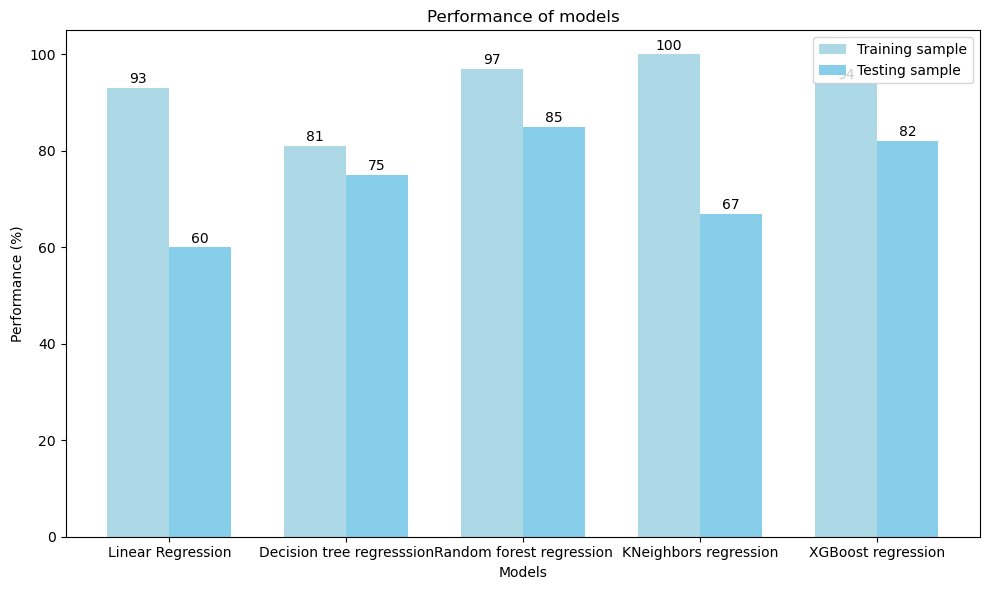

In [675]:
models = ['Linear Regression', 'Decision tree regresssion', 'Random forest regression', 
          'KNeighbors regression', 'XGBoost regression']

X_train_ohe_performance = [93, 81, 97, 100, 94]
X_test_ohe_performance = [60, 75, 85, 67, 82]

bar_width = 0.35

plt.figure(figsize=(10, 6))

index = range(len(models))

plt.bar(index, X_train_ohe_performance, bar_width, color = 'lightblue', label = 'Training sample')

plt.bar([i + bar_width for i in index], X_test_ohe_performance, bar_width, color = 'skyblue', label = 'Testing sample')

plt.title('Performance of models')
plt.xlabel('Models')
plt.ylabel('Performance (%)')

plt.xticks([i + bar_width / 2 for i in index], models)

plt.legend()

for i, value in enumerate(X_train_ohe_performance):
    plt.text(i, value + 1, str(value), ha = 'center')

for i, value in enumerate(X_test_ohe_performance):
    plt.text(i + bar_width, value + 1, str(value), ha = 'center')

plt.tight_layout()
plt.show()

## Graph reading for Ordered encoder

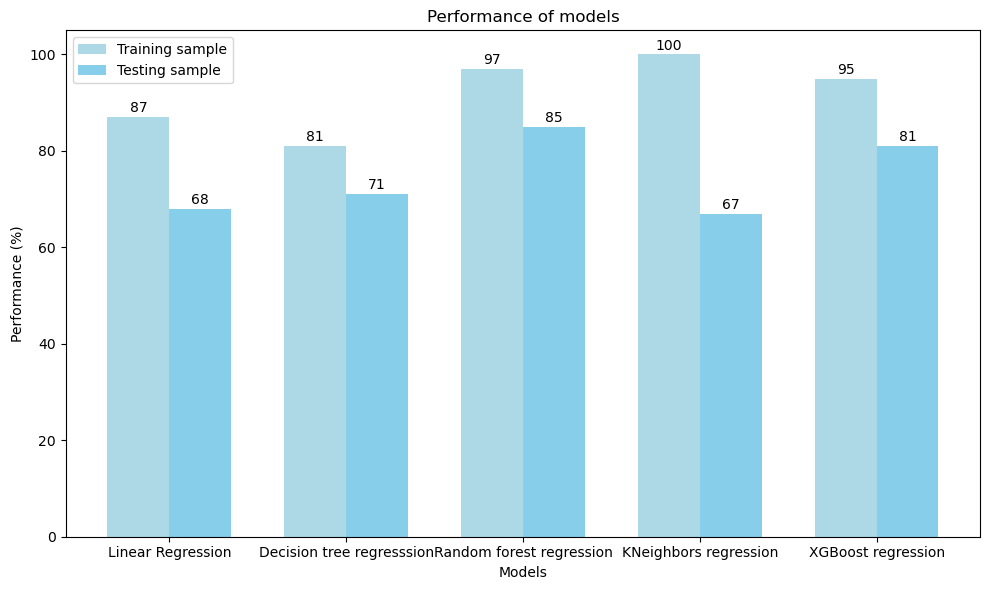

In [676]:
models = ['Linear Regression', 'Decision tree regresssion', 'Random forest regression', 
          'KNeighbors regression', 'XGBoost regression']

X_train_ordered_performance = [87, 81, 97, 100, 95]
X_test_ordered_performance = [68, 71, 85, 67, 81]

bar_width = 0.35

plt.figure(figsize=(10, 6))

index = range(len(models))

plt.bar(index, X_train_ordered_performance, bar_width, color = 'lightblue', label = 'Training sample')

plt.bar([i + bar_width for i in index], X_test_ordered_performance, bar_width, color = 'skyblue', label = 'Testing sample')

plt.title('Performance of models')
plt.xlabel('Models')
plt.ylabel('Performance (%)')

plt.xticks([i + bar_width / 2 for i in index], models)

plt.legend()

for i, value in enumerate(X_train_ordered_performance):
    plt.text(i, value + 1, str(value), ha = 'center')

for i, value in enumerate(X_test_ordered_performance):
    plt.text(i + bar_width, value + 1, str(value), ha = 'center')

plt.tight_layout()
plt.show()

## Discretization

In [677]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['SalePrice'], axis = 1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0

)

X_train.shape, X_test.shape

((1022, 80), (438, 80))

In [678]:
imputer = MeanMedianImputer(imputation_method='mean')
imputer.fit(X_train)
X_train = imputer.transform(X_train)
X_test = imputer.transform(X_test)

In [679]:
def diagnostic_plot(df, var):
    
    plt.figure(figsize=(16, 4))
    
    plt.subplot(1, 3, 1)
    sns.histplot(df[var], bins = 30)
    plt.title('Histogram')
    
    plt.subplot(1, 3, 2)
    stats.probplot(df[var], dist = 'norm', plot = plt)
    plt.ylabel('Variable quantile')
    
    plt.subplot(1, 3, 3)
    sns.boxplot(y = df[var])
    plt.title('Boxplot')
    
    plt.show()

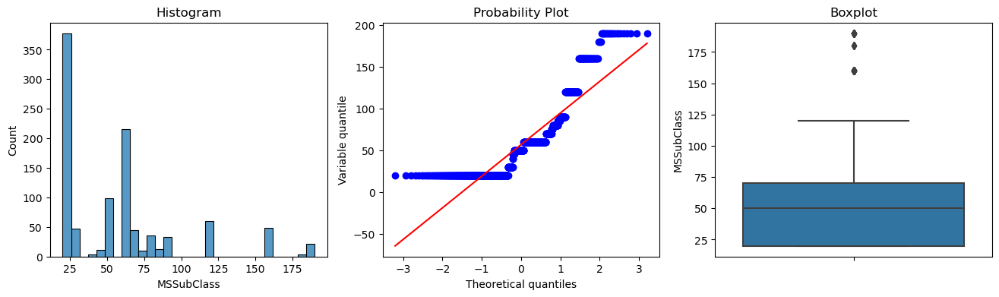

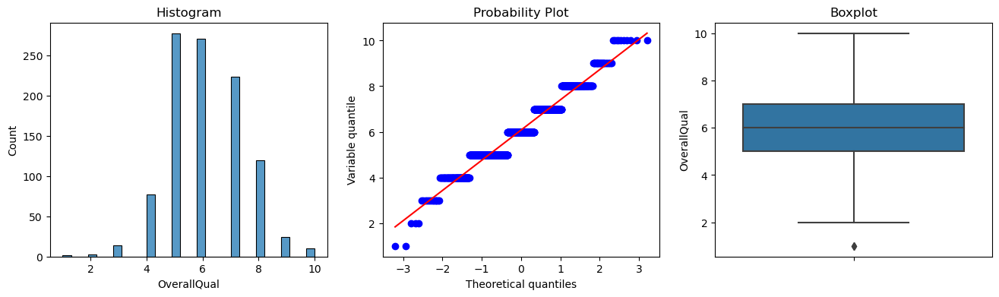

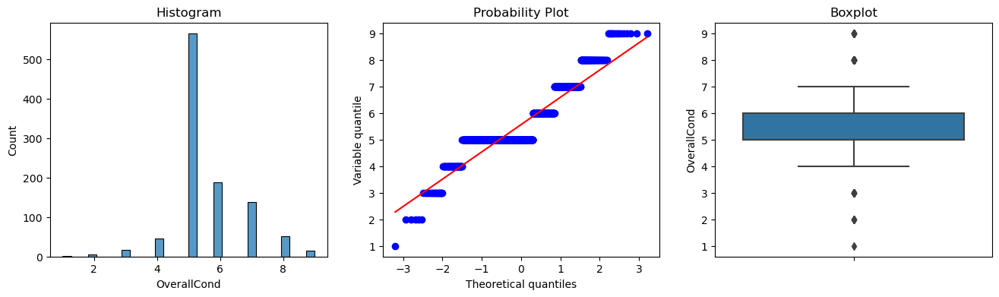

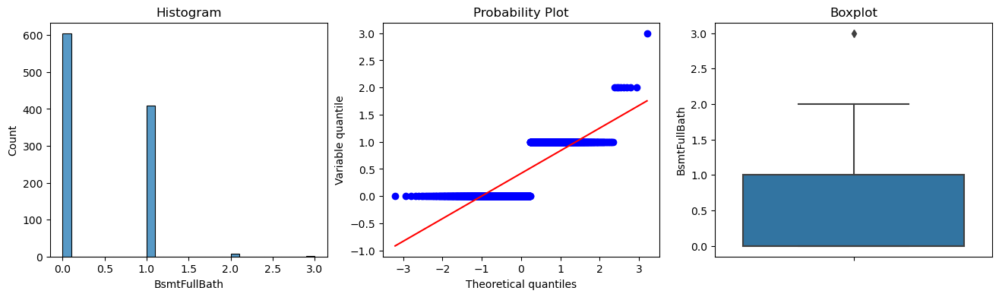

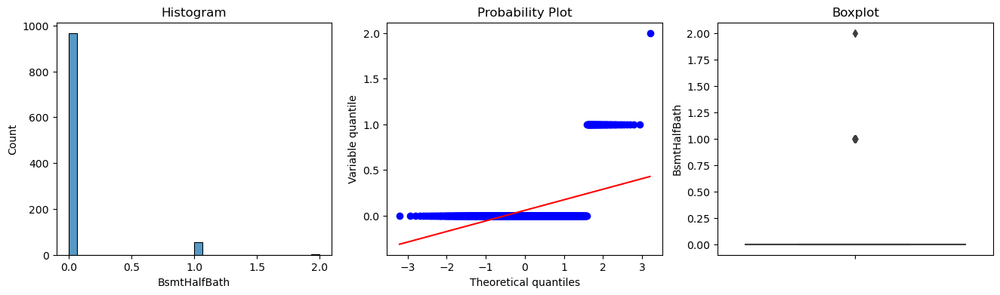

...

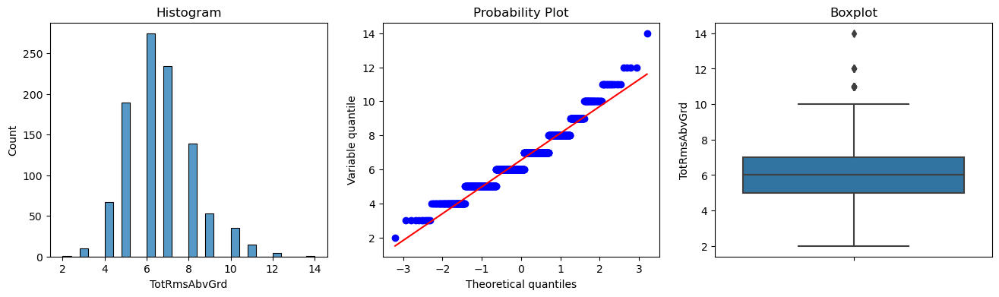

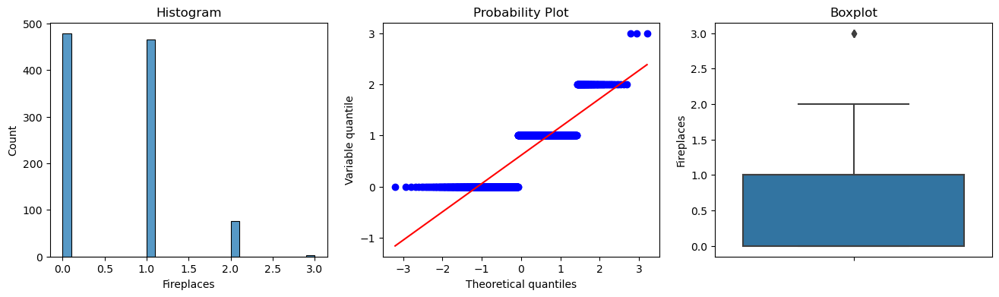

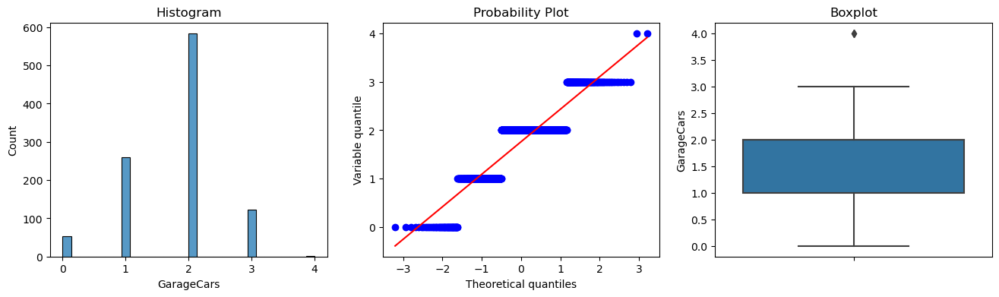

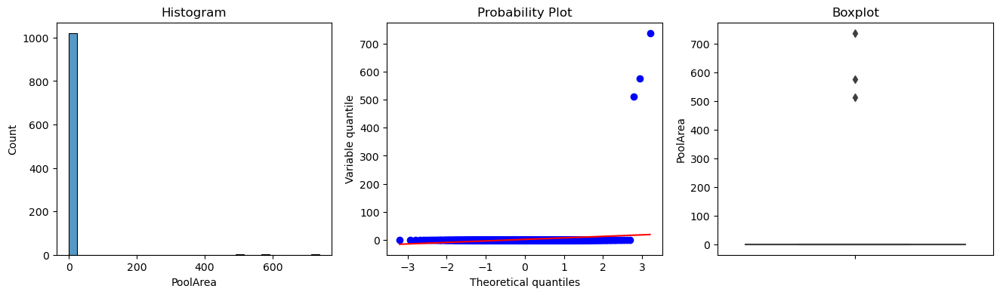

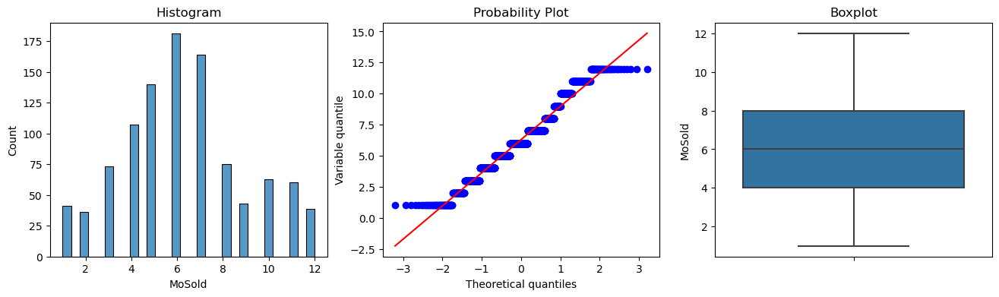

In [680]:
for col in X_train[discrete]:
    diagnostic_plot(X_train, col)

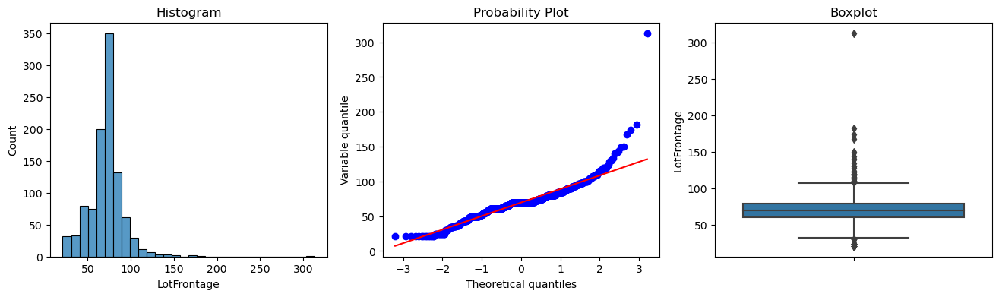

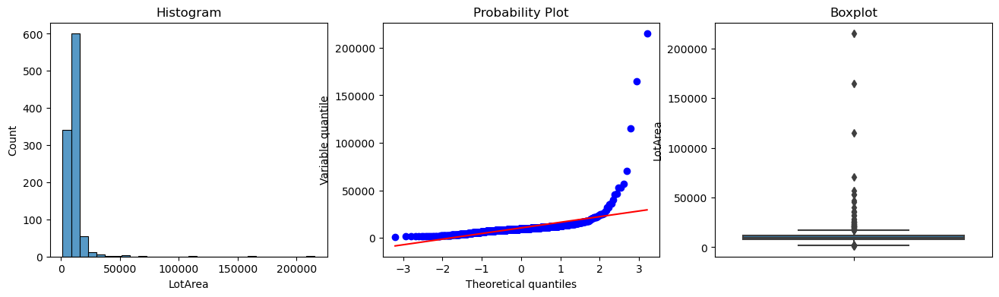

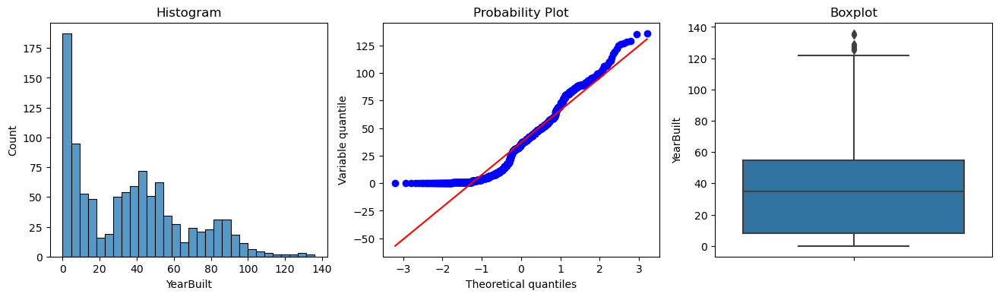

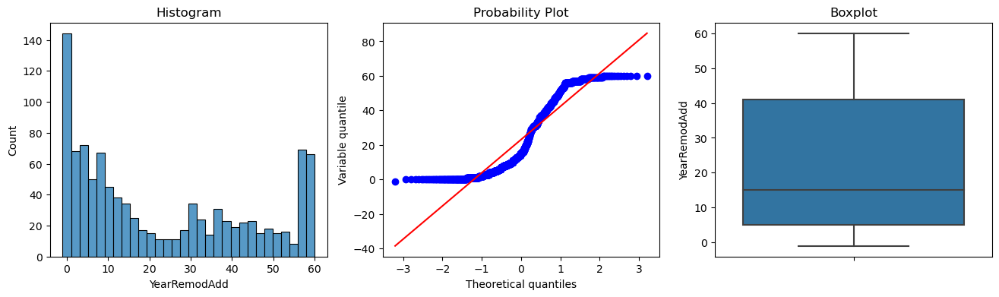

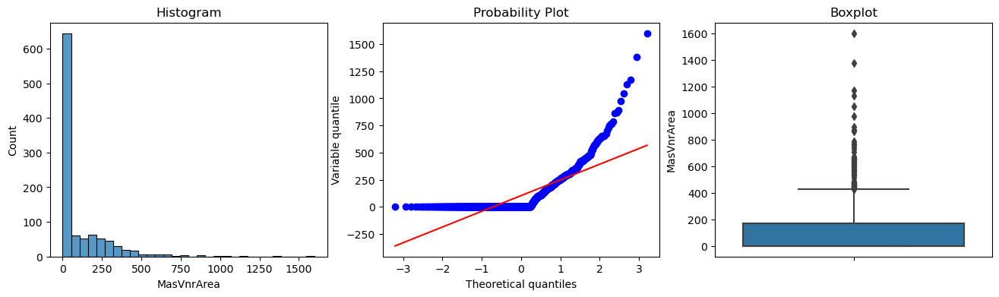

...

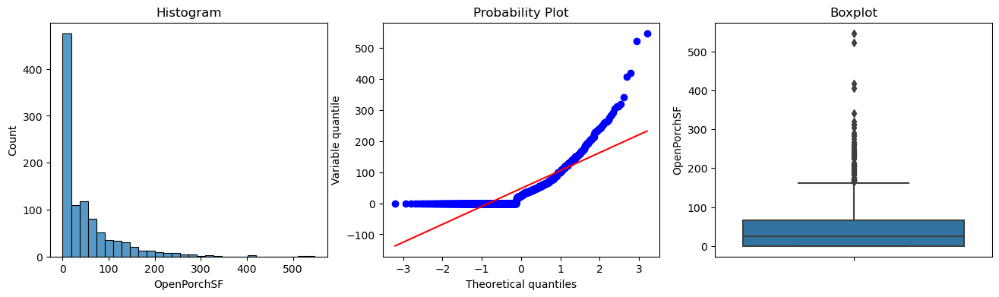

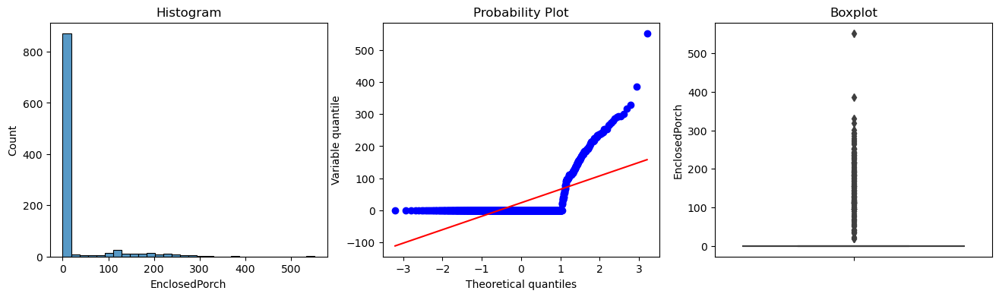

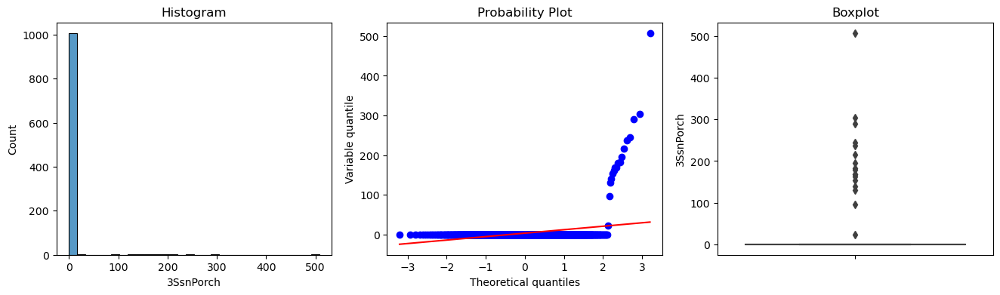

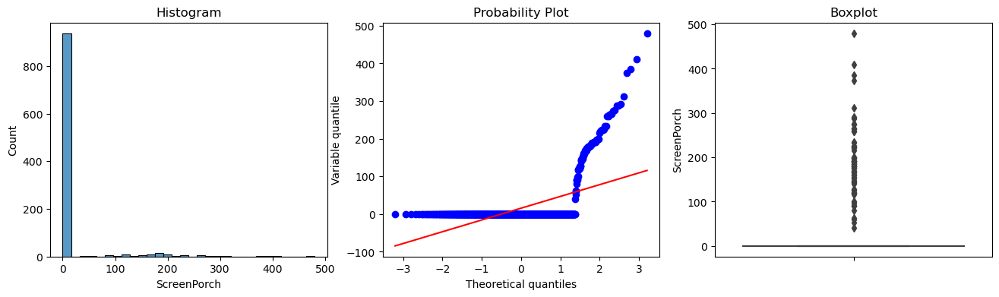

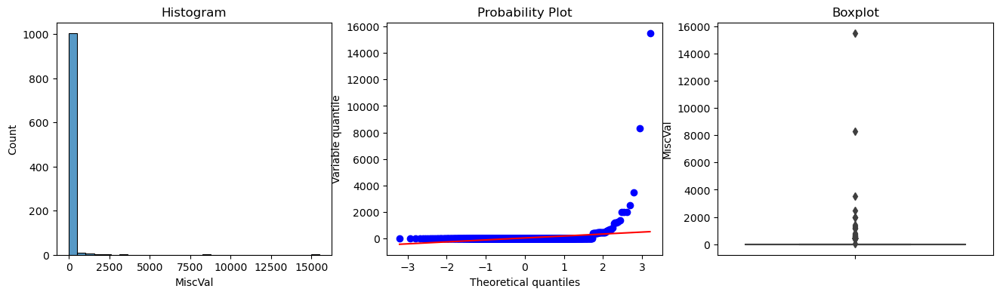

In [681]:
for col in X_train[continuous]:
    diagnostic_plot(X_train, col)

## EqualFrequency discretization

In [682]:
disc = EqualFrequencyDiscretiser(q = 10, variables = continuous)
disc.fit(X_train)

EqualFrequencyDiscretiser(variables=['LotFrontage', 'LotArea', 'YearBuilt',
                                     'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
                                     'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
                                     '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
                                     'GrLivArea', 'GarageYrBlt', 'GarageArea',
                                     'WoodDeckSF', 'OpenPorchSF',
                                     'EnclosedPorch', '3SsnPorch',
                                     'ScreenPorch', 'MiscVal'])

In [683]:
disc.binner_dict_

{'LotFrontage': [-inf,
  49.10000000000001,
  58.0,
  60.0,
  68.40000000000003,
  69.66866746698679,
  70.0,
  75.0,
  80.0,
  91.0,
  inf],
 'LotArea': [-inf,
  5007.1,
  7164.6,
  8165.700000000001,
  8882.0,
  9536.0,
  10200.0,
  11046.300000000001,
  12166.400000000001,
  14373.9,
  inf],
 'YearBuilt': [-inf,
  1.0,
  5.0,
  11.0,
  25.0,
  35.0,
  43.0,
  50.700000000000045,
  60.0,
  83.89999999999998,
  inf],
 'YearRemodAdd': [-inf,
  1.0,
  3.0,
  6.0,
  10.0,
  15.0,
  28.0,
  37.0,
  46.0,
  56.0,
  inf],
 'MasVnrArea': [-inf,
  16.0,
  116.70000000000005,
  211.60000000000014,
  320.0,
  inf],
 'BsmtFinSF1': [-inf,
  229.2000000000001,
  386.0,
  539.6000000000001,
  655.0,
  813.6000000000001,
  1073.6999999999998,
  inf],
 'BsmtFinSF2': [-inf, 127.89999999999998, inf],
 'BsmtUnfSF': [-inf,
  78.20000000000002,
  175.20000000000002,
  280.0,
  374.40000000000003,
  486.5,
  611.6000000000001,
  731.7,
  894.0,
  1193.6999999999998,
  inf],
 'TotalBsmtSF': [-inf,
  650.400

In [684]:
X_train = disc.transform(X_train)
X_test = disc.transform(X_test)

Text(0, 0.5, 'Number of observations per bin')

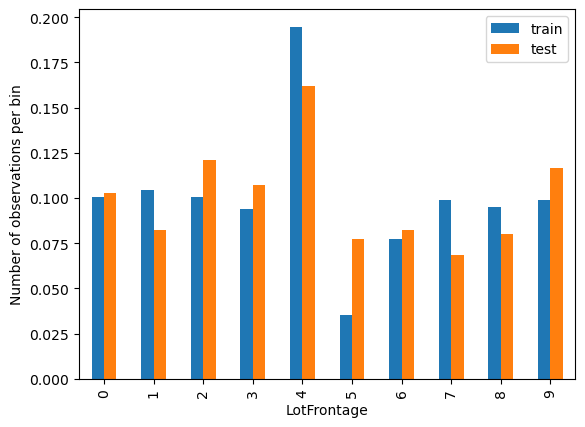

In [685]:
t1 = X_train.groupby(['LotFrontage'])['LotFrontage'].count() / len(X_train)
t2 = X_test.groupby(['LotFrontage'])['LotFrontage'].count() / len(X_test)

tmp = pd.concat([t1, t2], axis = 1)
tmp.columns = ['train', 'test']
tmp.plot.bar()
plt.xticks(rotation = 90)
plt.ylabel('Number of observations per bin')

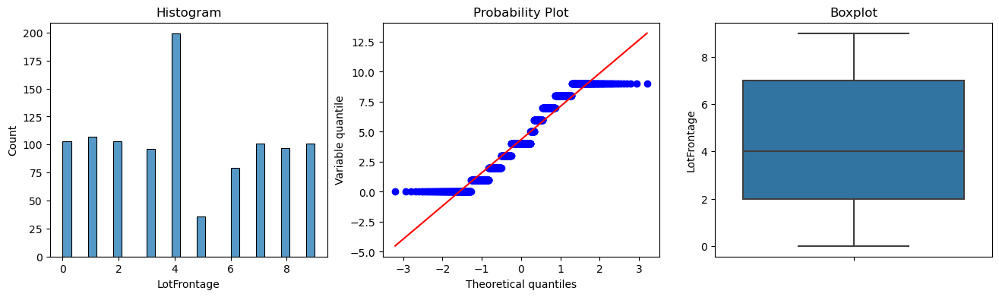

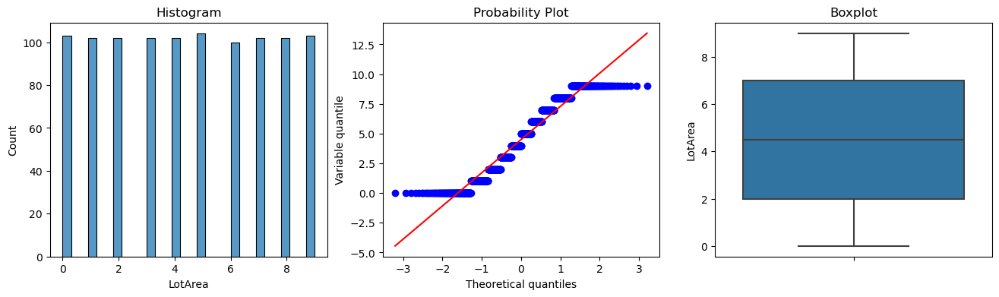

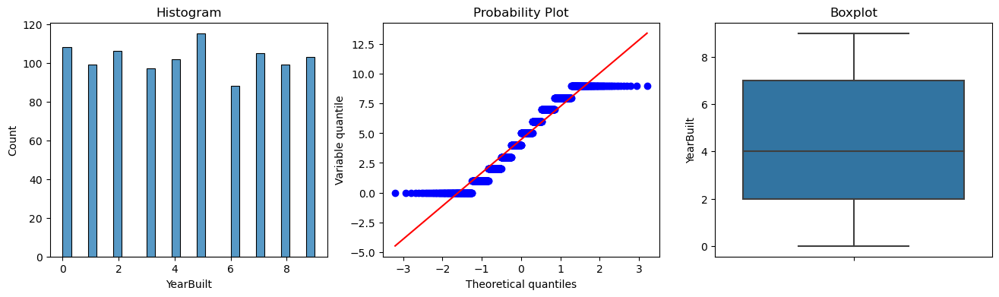

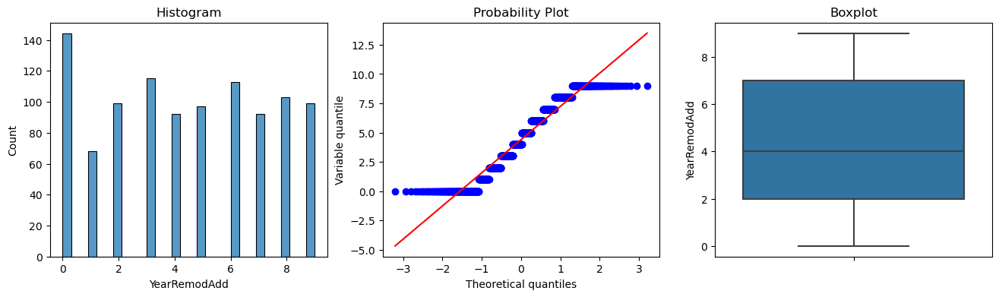

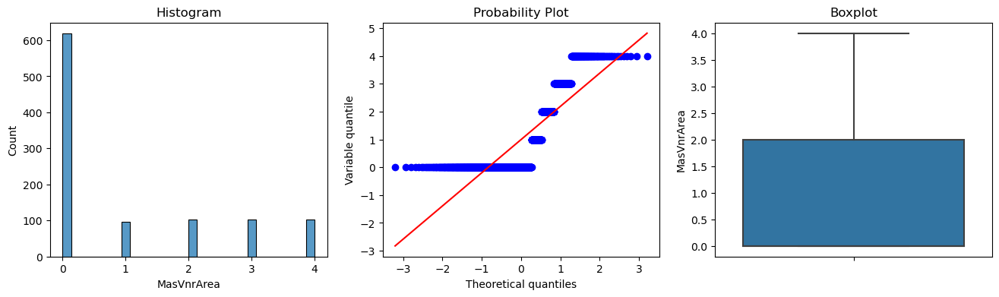

...

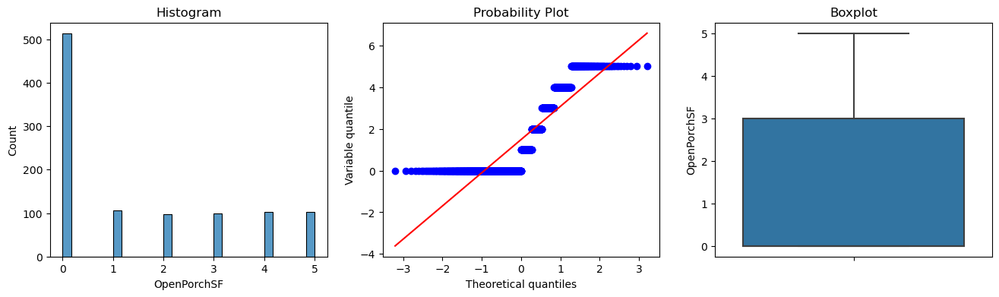

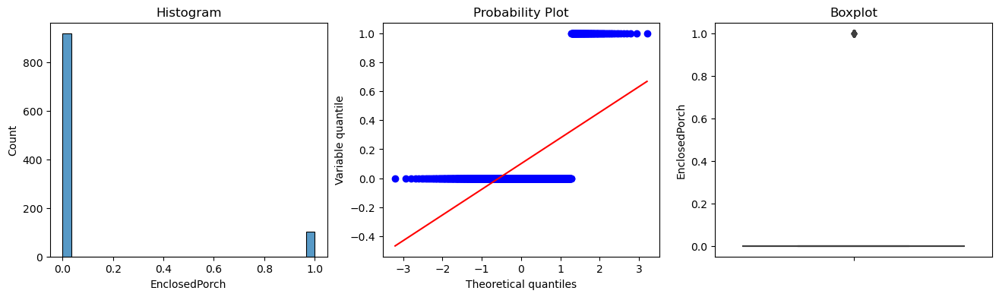

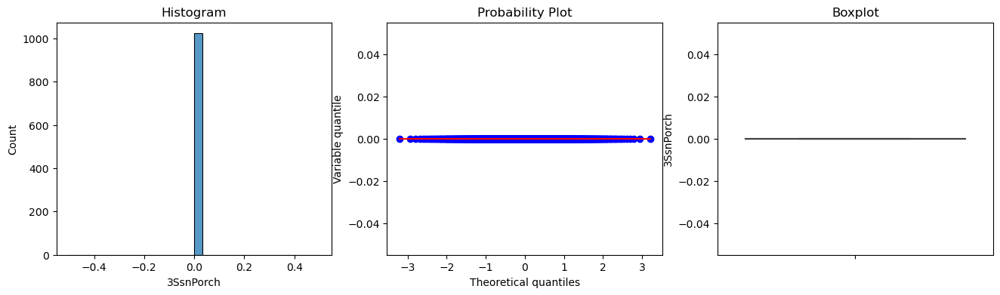

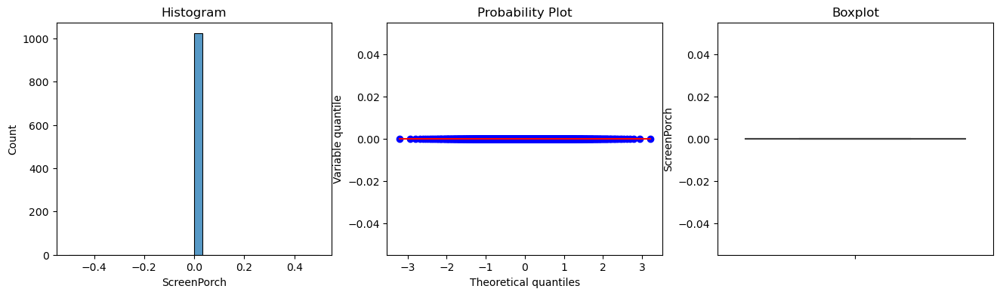

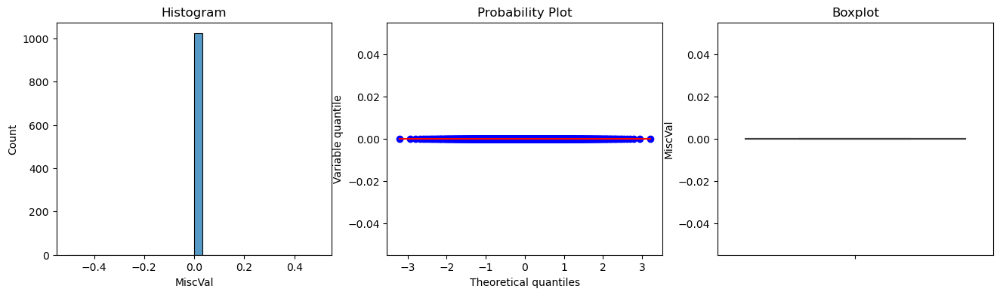

In [686]:
for col in X_train[continuous]:
    diagnostic_plot(X_train, col)

### conclusion: 
    - After discretization, we see that the problem of outliers in numerical variables has been solved, and the distribution in the training and test sets is not much different.

## EquelWidth discretizer

In [687]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['SalePrice'], axis = 1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0

)

X_train.shape, X_test.shape

((1022, 80), (438, 80))

In [688]:
imputer = MeanMedianImputer(imputation_method='mean', variables=continuous+discrete)
imputer.fit(X_train)
X_train = imputer.transform(X_train)
X_test = imputer.transform(X_test)

In [689]:
disc = EqualWidthDiscretiser(bins = 10, variables = continuous)
disc.fit(X_train)

EqualWidthDiscretiser(variables=['LotFrontage', 'LotArea', 'YearBuilt',
                                 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
                                 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
                                 '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
                                 'GrLivArea', 'GarageYrBlt', 'GarageArea',
                                 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
                                 '3SsnPorch', 'ScreenPorch', 'MiscVal'])

In [690]:
X_train = disc.transform(X_train)
X_test = disc.transform(X_test)

Text(0, 0.5, 'Number of observations per bin')

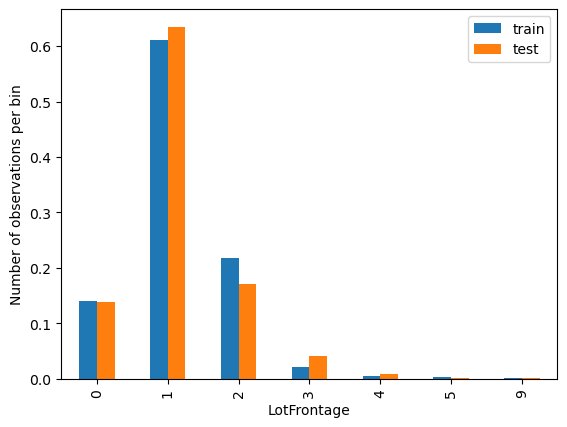

In [691]:
t1 = X_train.groupby(['LotFrontage'])['LotFrontage'].count() / len(X_train)
t2 = X_test.groupby(['LotFrontage'])['LotFrontage'].count() / len(X_test)

tmp = pd.concat([t1, t2], axis = 1)
tmp.columns = ['train', 'test']
tmp.plot.bar()
plt.xticks(rotation = 90)
plt.ylabel('Number of observations per bin')

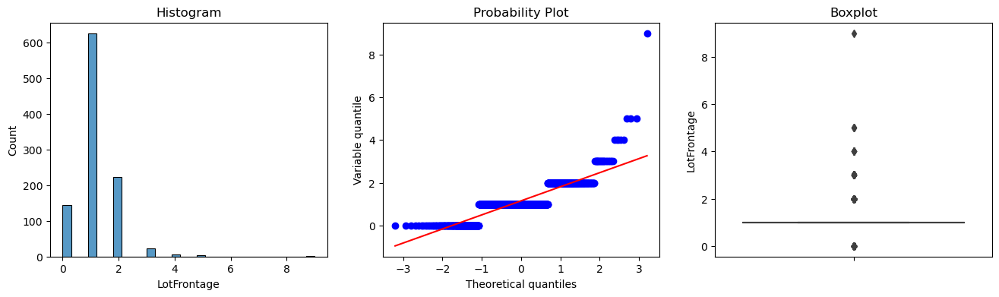

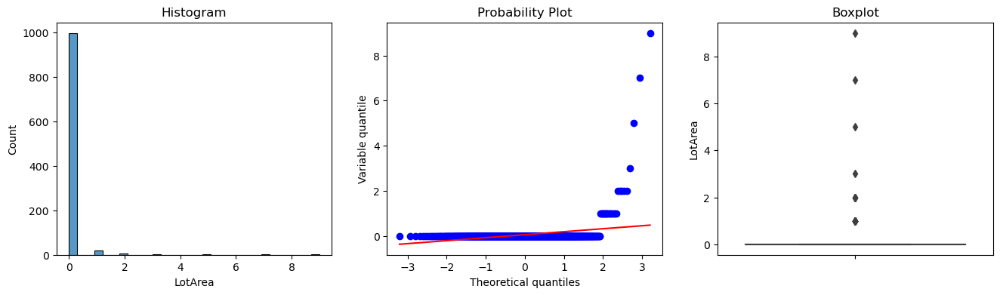

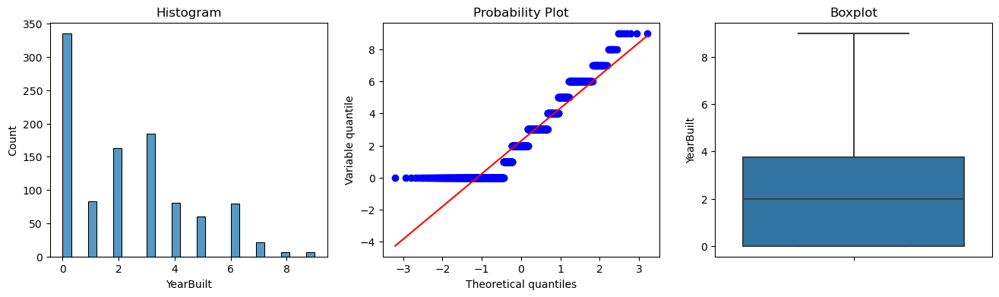

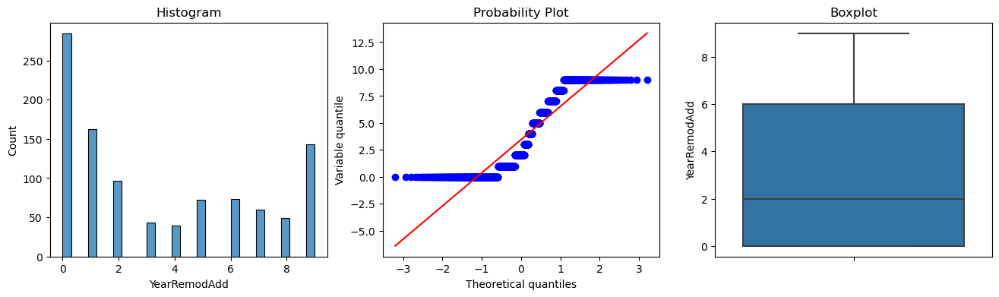

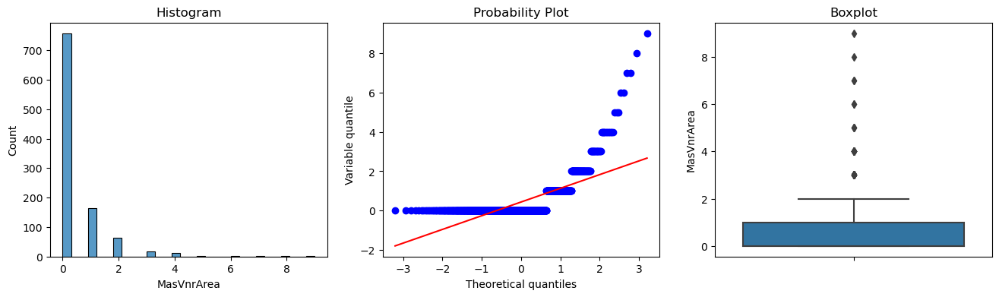

...

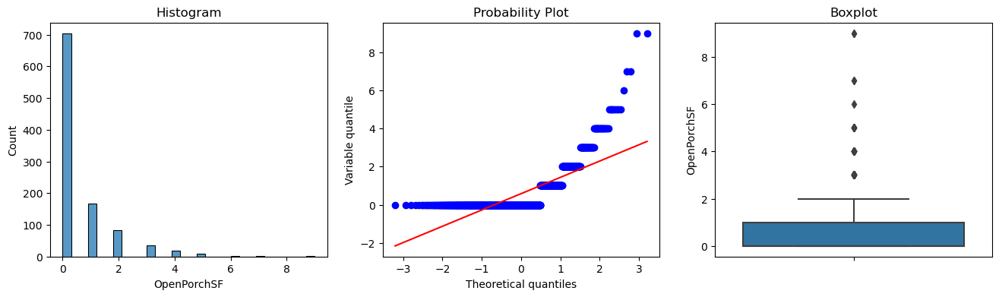

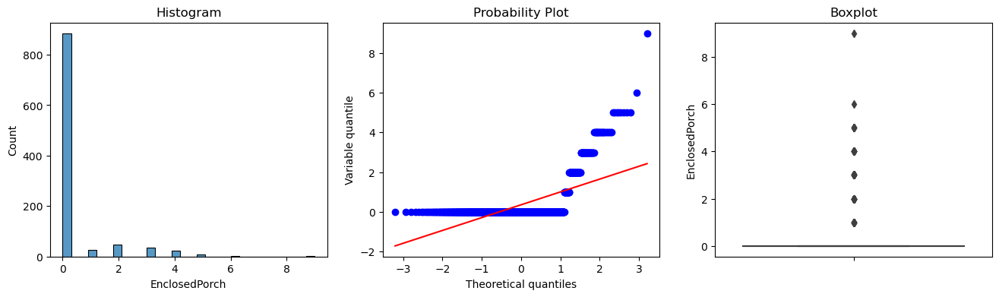

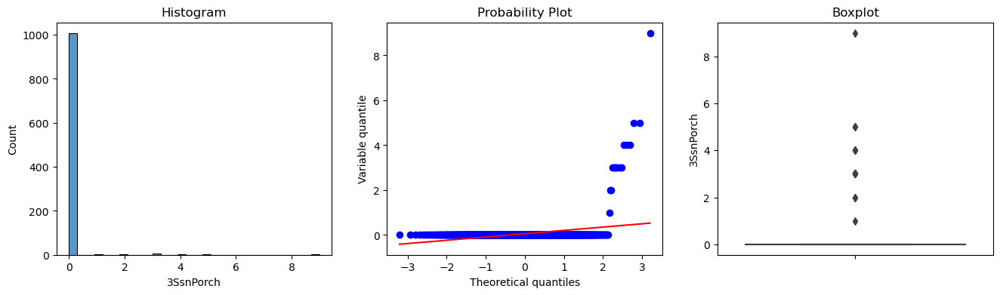

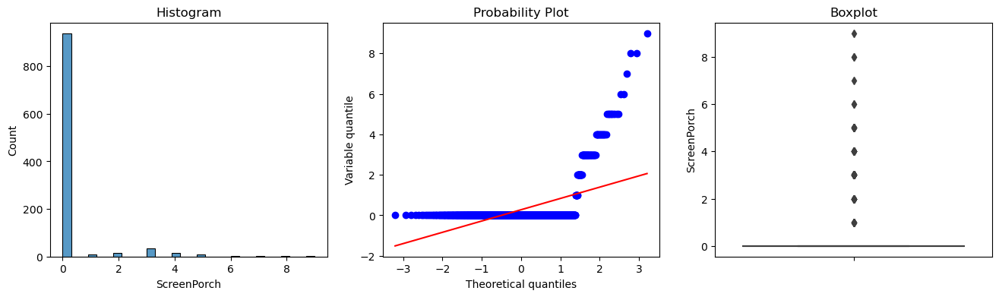

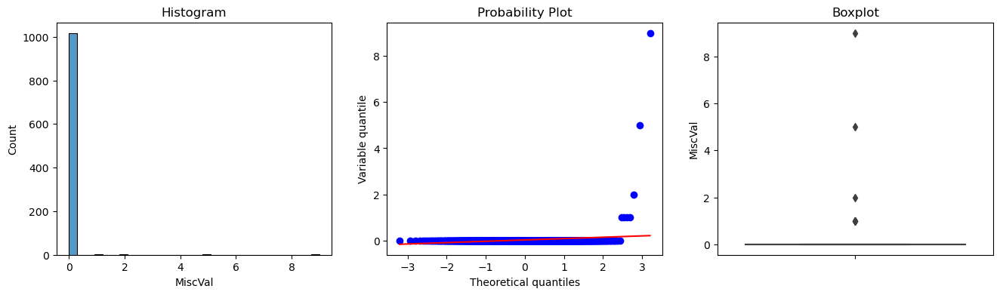

In [692]:
for col in X_train[continuous]:
    diagnostic_plot(X_train, col)

### conclusion: 
    - With this discretization method, the problem of outlayers remains, but the distribution in the training and test sets is not much different

## Conclusion:
    - Since we have solved the outlier problem with the equal-frequency discretization method, we will use this method

## Gaussian transformation

In [693]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['SalePrice'], axis = 1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0
)

X_train.shape, X_test.shape

((1022, 80), (438, 80))

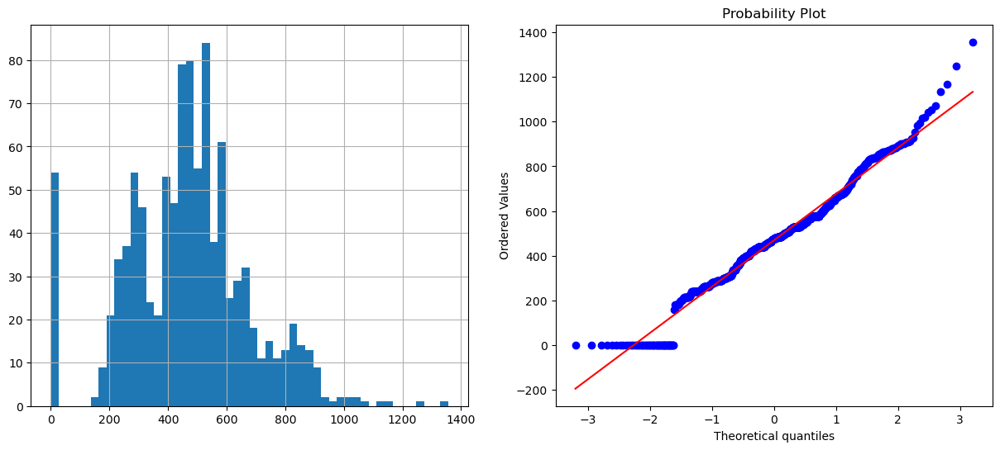

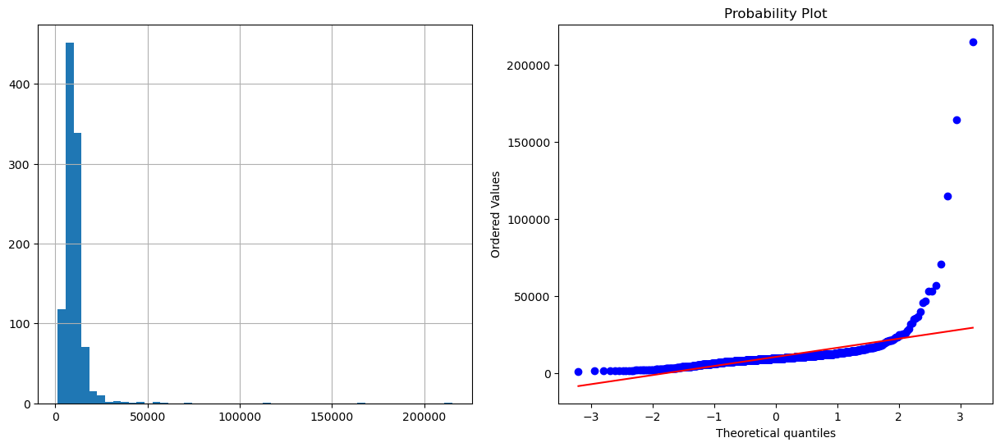

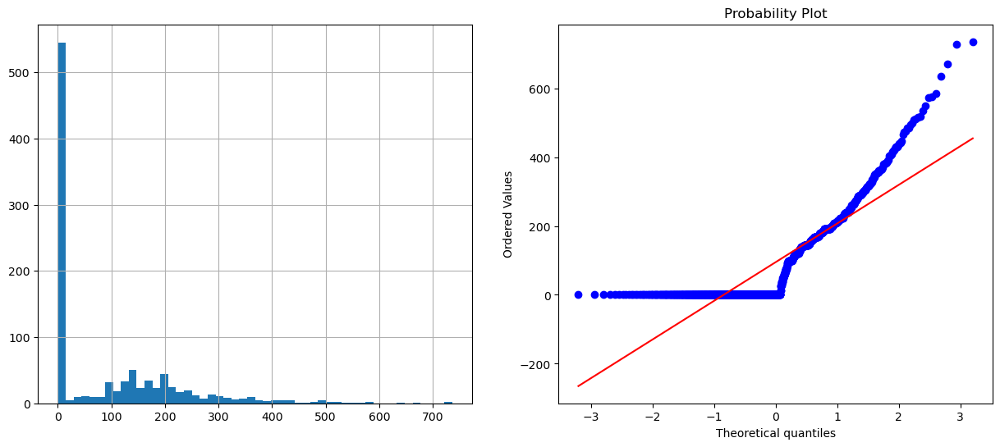

In [694]:
for col in ['GarageArea', 'LotArea', 'WoodDeckSF']:
    diagnostic_plots(X_train, col)

### Log transformation

In [695]:
log = LogCpTransformer(variables=['GarageArea', 'LotArea', 'WoodDeckSF'], base = 'e')
log.fit(X_train)

LogCpTransformer(variables=['GarageArea', 'LotArea', 'WoodDeckSF'])

In [696]:
X_train = log.transform(X_train)
X_test = log.transform(X_test)

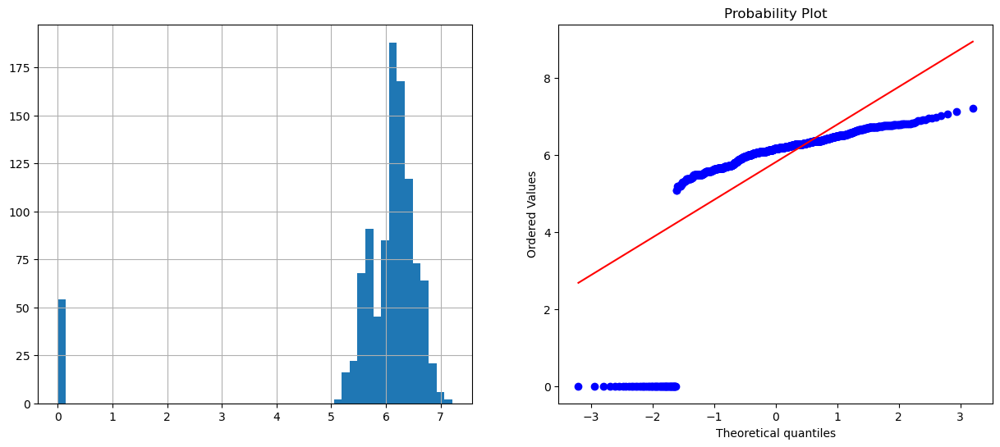

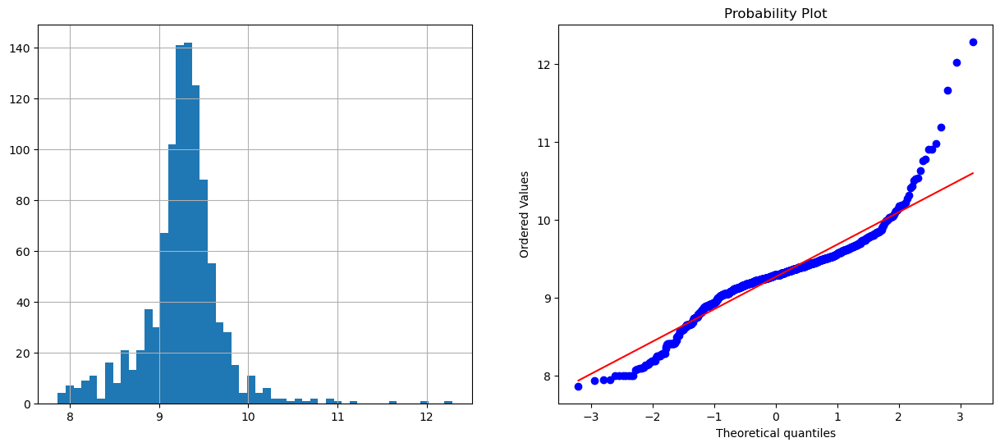

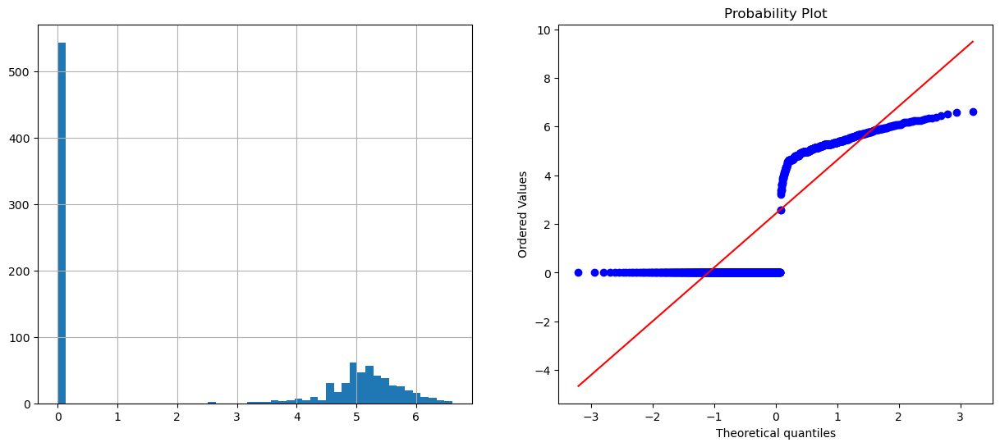

In [697]:
for col in ['GarageArea', 'LotArea', 'WoodDeckSF']:
    diagnostic_plots(X_train, col)

### Reciprocal transformation

In [698]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['SalePrice'], axis = 1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0

)

X_train.shape, X_test.shape

((1022, 80), (438, 80))

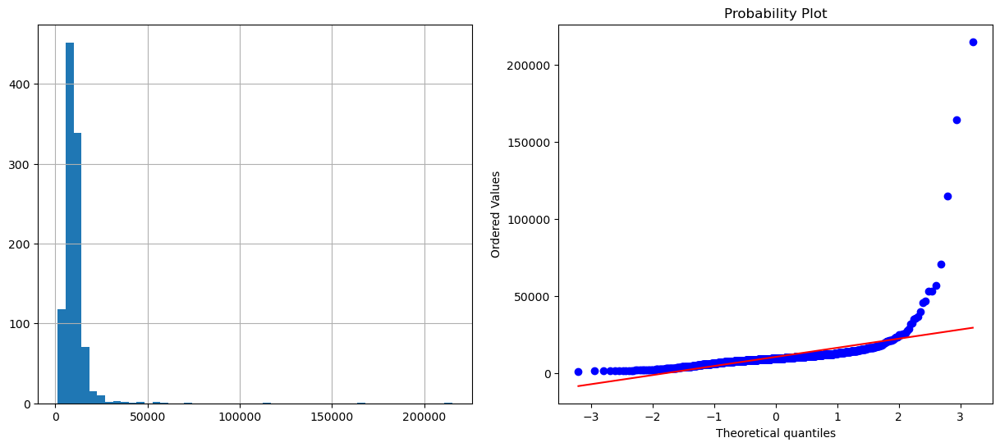

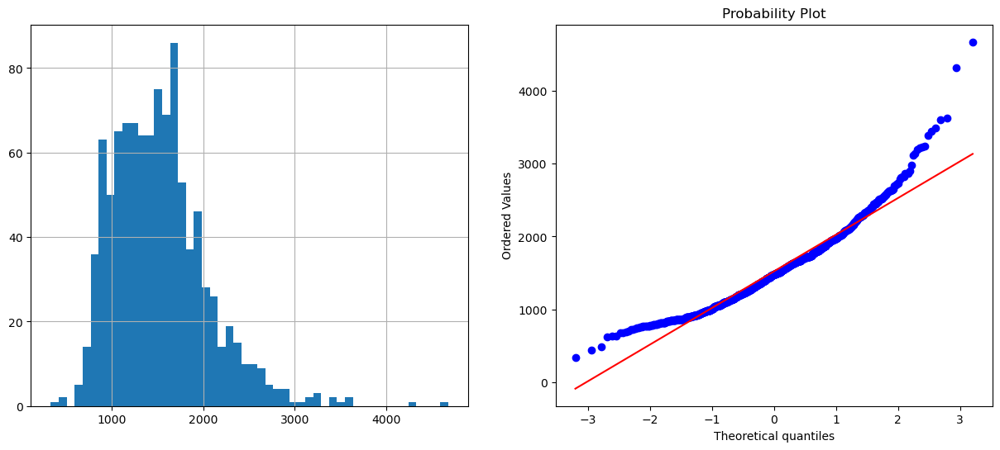

In [699]:
for col in ['LotArea', 'GrLivArea']:
    diagnostic_plots(X_train, col)

In [700]:
rec = ReciprocalTransformer(variables=['LotArea', 'GrLivArea'])
rec.fit(X_train)

ReciprocalTransformer(variables=['LotArea', 'GrLivArea'])

In [701]:
X_train = rec.transform(X_train)
X_test = rec.transform(X_test)

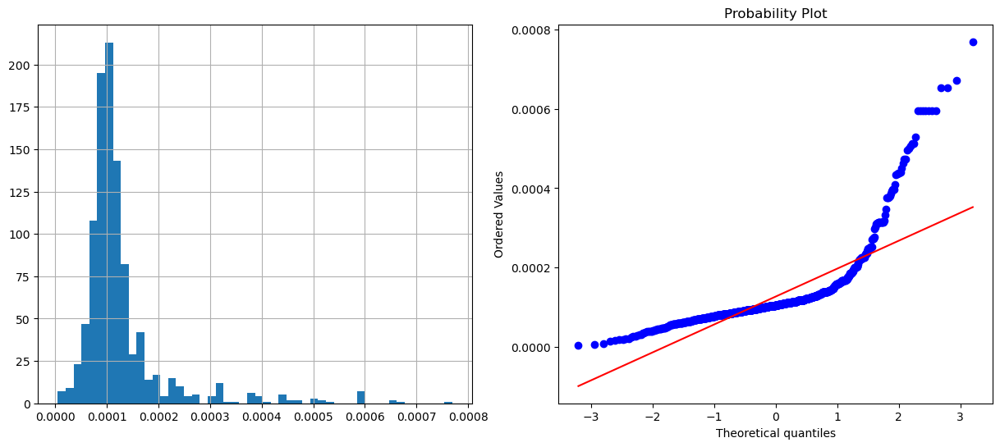

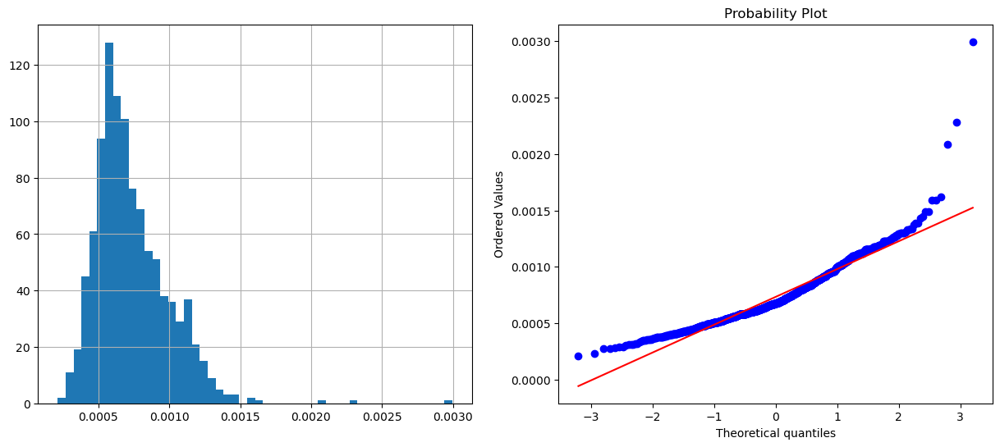

In [702]:
for col in ['LotArea', 'GrLivArea']:
    diagnostic_plots(X_train, col)

### Exponential transformation

In [703]:
exp = PowerTransformer(variables=['GarageArea', 'LotArea', 'WoodDeckSF'])
exp.fit(X_train)

PowerTransformer(variables=['GarageArea', 'LotArea', 'WoodDeckSF'])

In [704]:
X_train = exp.transform(X_train)
X_test = exp.transform(X_test)

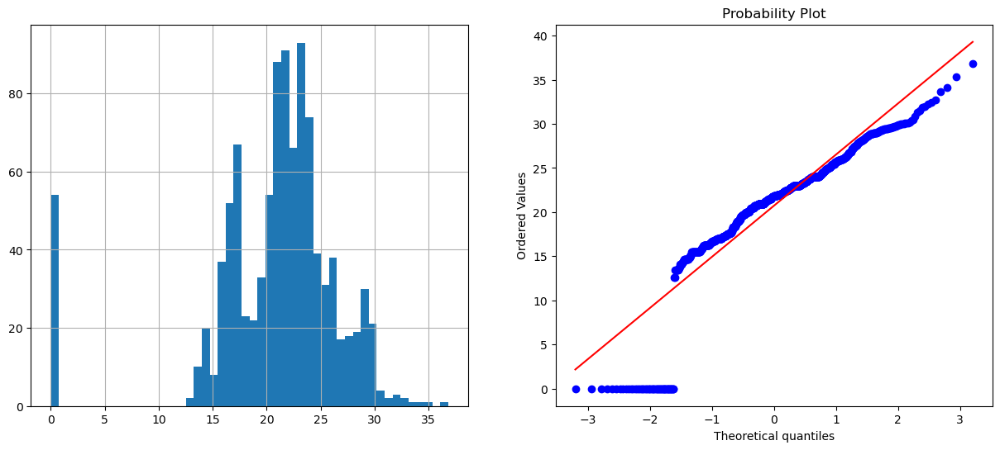

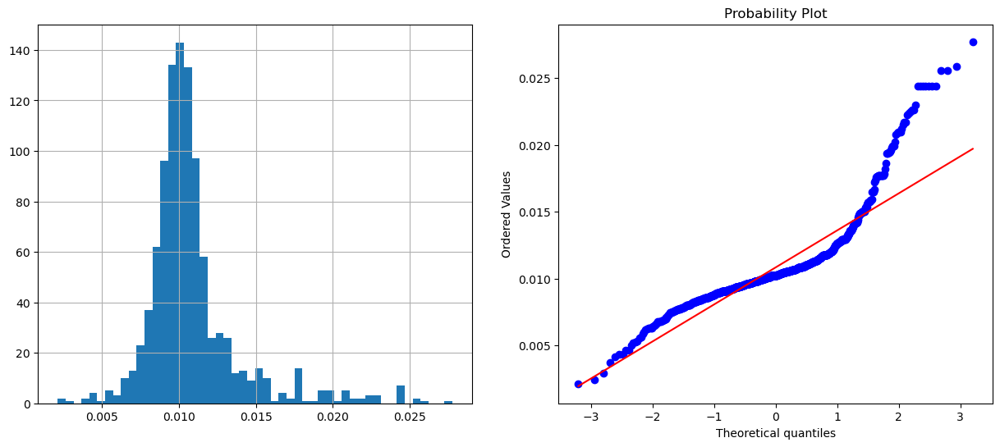

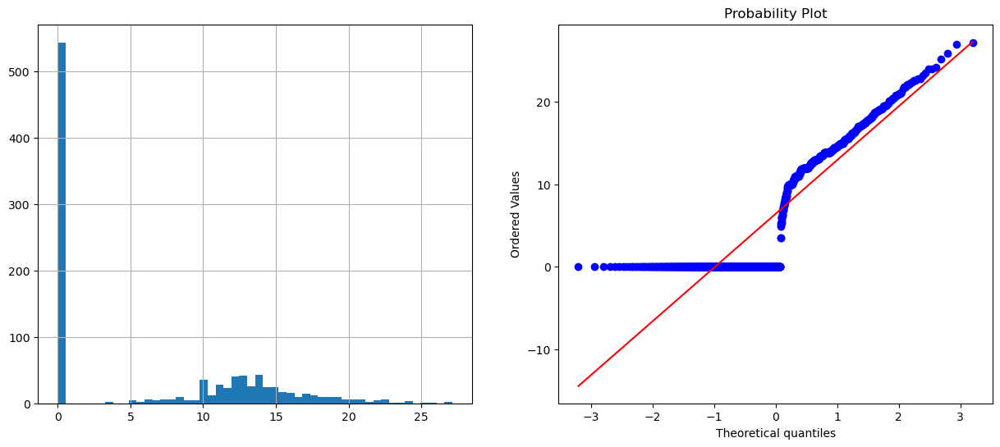

In [705]:
for col in ['GarageArea', 'LotArea', 'WoodDeckSF']:
    diagnostic_plots(X_train, col)

### Box_cox transformation

In [706]:
bct = BoxCoxTransformer(variables=['LotArea', 'GrLivArea'])
bct.fit(X_train)

BoxCoxTransformer(variables=['LotArea', 'GrLivArea'])

In [707]:
X_train = bct.transform(X_train)
X_test = bct.transform(X_test)

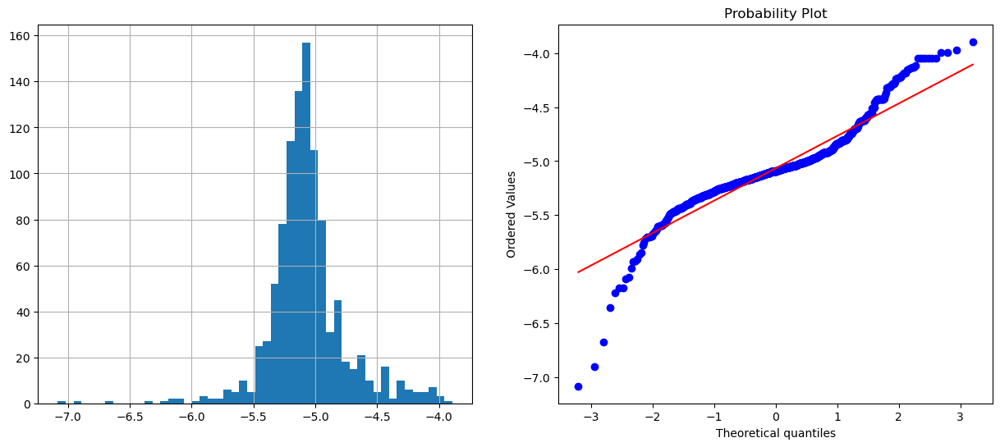

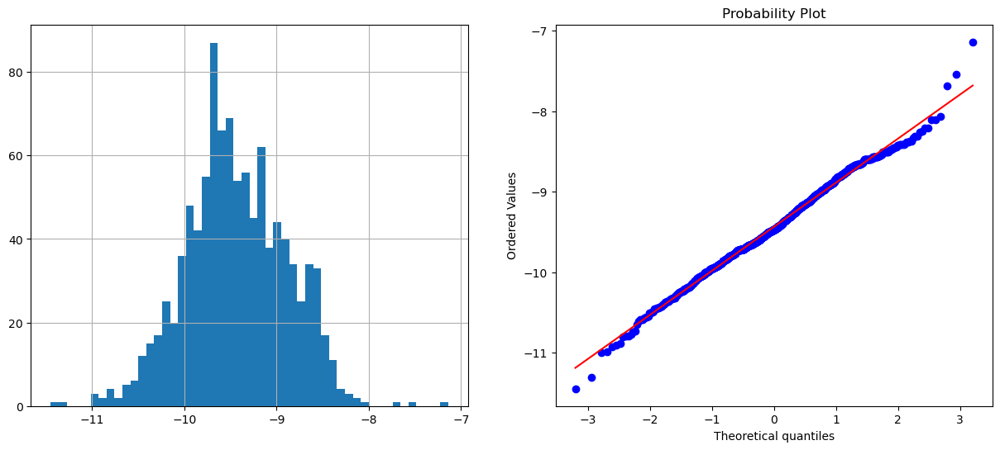

In [708]:
for col in ['LotArea', 'GrLivArea']:
    diagnostic_plots(X_train, col)

### Yeo_Johnson transformation

In [709]:
yjt = YeoJohnsonTransformer(variables=['GarageArea', 'LotArea', 'WoodDeckSF'])
yjt.fit(X_train)

YeoJohnsonTransformer(variables=['GarageArea', 'LotArea', 'WoodDeckSF'])

In [710]:
X_train = yjt.transform(X_train)
X_test = yjt.transform(X_test)

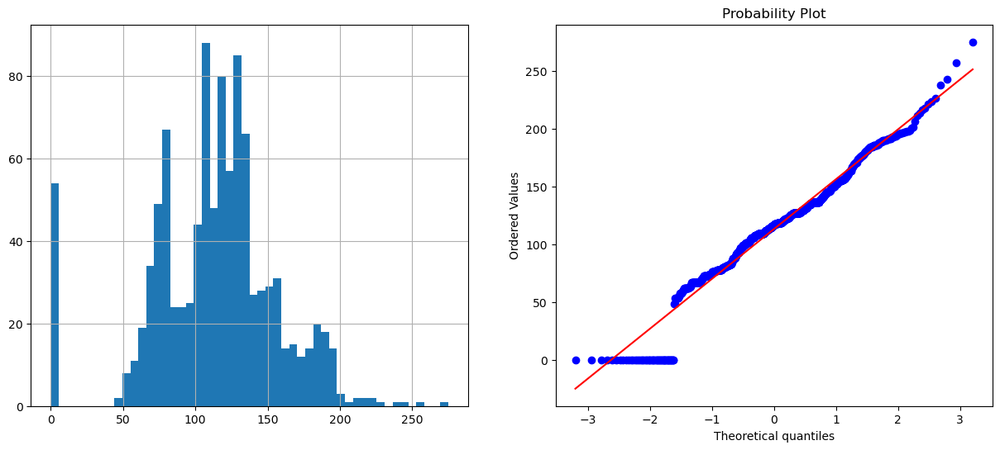

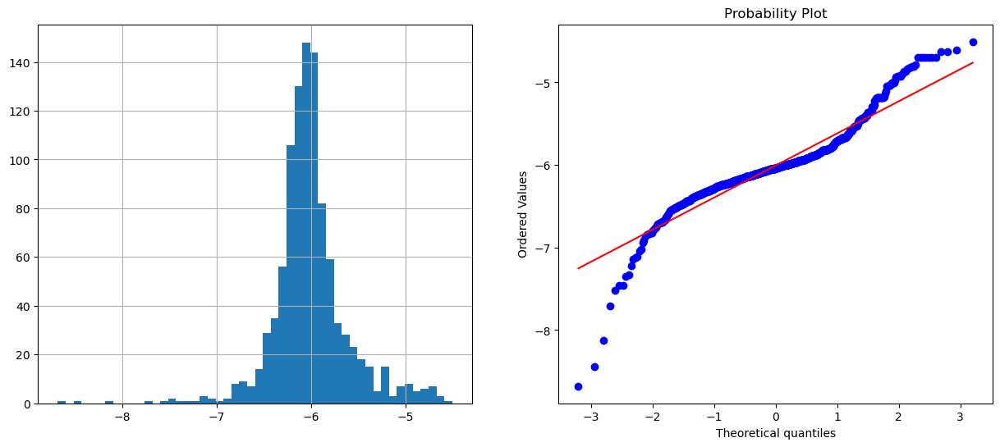

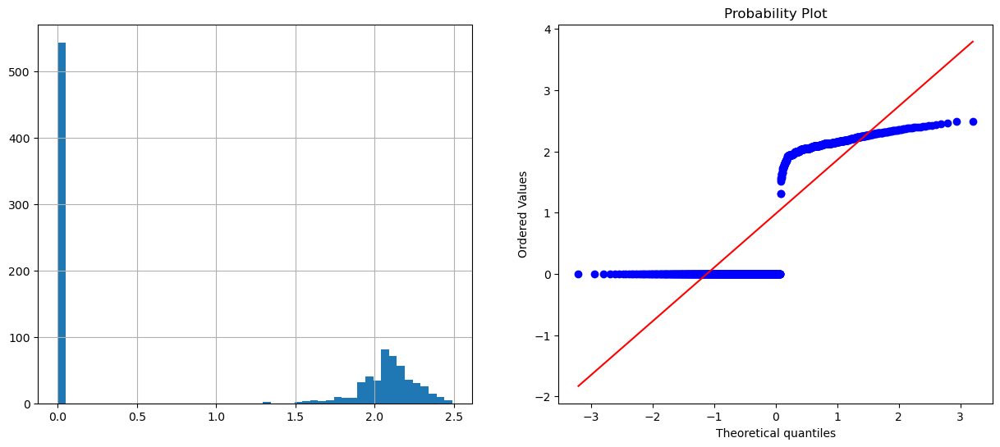

In [711]:
for col in ['GarageArea', 'LotArea', 'WoodDeckSF']:
    diagnostic_plots(X_train, col)

### conclusion: judging by the graphs, the Yeo-Johnson method is most suitable

## Scaling

### MinMax scaling

In [712]:
X_train, X_test, y_train, y_test = train_test_split(
    data[numerical],
    data['SalePrice'],
    test_size=0.3,
    random_state=0

)

X_train.shape, X_test.shape

((1022, 37), (438, 37))

In [713]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [714]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

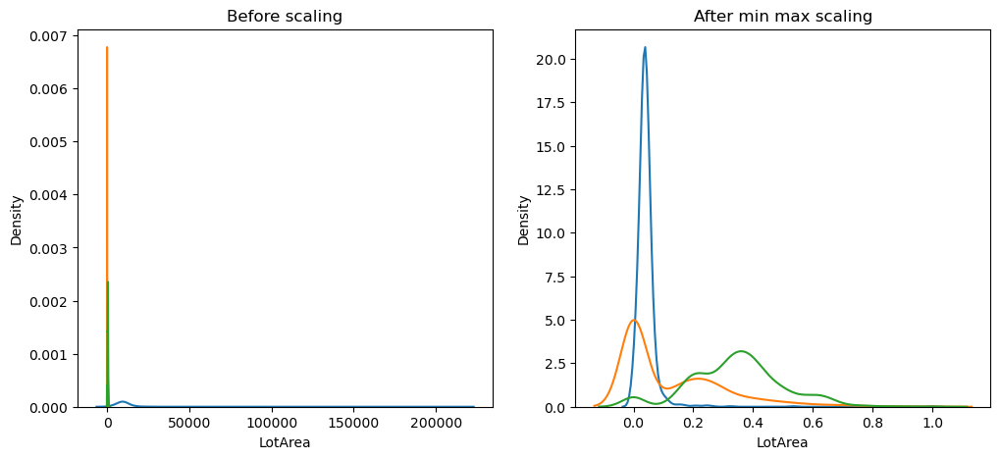

In [715]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (12, 5))

#before scaling
ax1.set_title('Before scaling')
sns.kdeplot(X_train['LotArea'], ax = ax1)
sns.kdeplot(X_train['WoodDeckSF'], ax = ax1)
sns.kdeplot(X_train['GarageArea'], ax = ax1)

#after scaling
ax2.set_title('After min max scaling')
sns.kdeplot(X_train_scaled['LotArea'], ax = ax2)
sns.kdeplot(X_train_scaled['WoodDeckSF'], ax = ax2)
sns.kdeplot(X_train_scaled['GarageArea'], ax = ax2)
plt.show()

### Robust scaling

In [716]:
X_train, X_test, y_train, y_test = train_test_split(
    data[numerical],
    data['SalePrice'],
    test_size=0.3,
    random_state=0

)

X_train.shape, X_test.shape

((1022, 37), (438, 37))

In [717]:
scaler = RobustScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [718]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

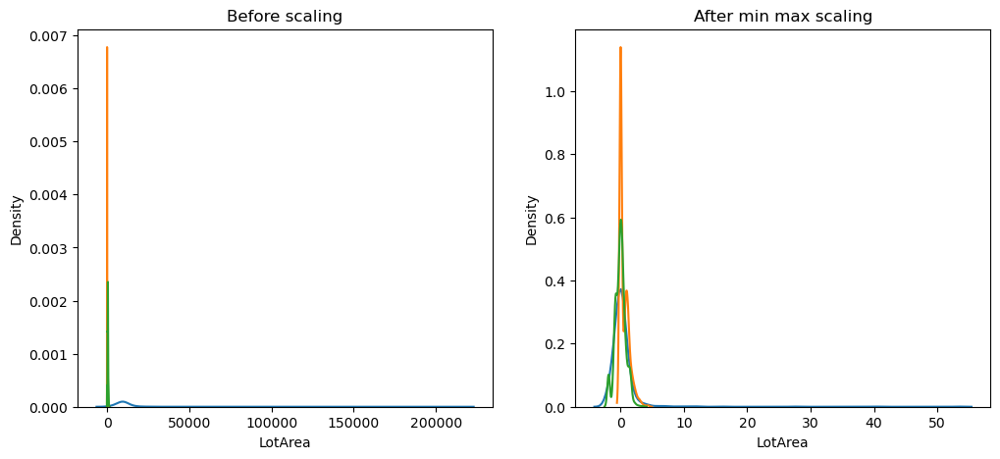

In [719]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (12, 5))

#before scaling
ax1.set_title('Before scaling')
sns.kdeplot(X_train['LotArea'], ax = ax1)
sns.kdeplot(X_train['WoodDeckSF'], ax = ax1)
sns.kdeplot(X_train['GarageArea'], ax = ax1)

#after scaling
ax2.set_title('After min max scaling')
sns.kdeplot(X_train_scaled['LotArea'], ax = ax2)
sns.kdeplot(X_train_scaled['WoodDeckSF'], ax = ax2)
sns.kdeplot(X_train_scaled['GarageArea'], ax = ax2)
plt.show()

### MaxAbs scaling

In [720]:
X_train, X_test, y_train, y_test = train_test_split(
    data[numerical],
    data['SalePrice'],
    test_size=0.3,
    random_state=0

)

X_train.shape, X_test.shape

((1022, 37), (438, 37))

In [721]:
scaler = MaxAbsScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [722]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

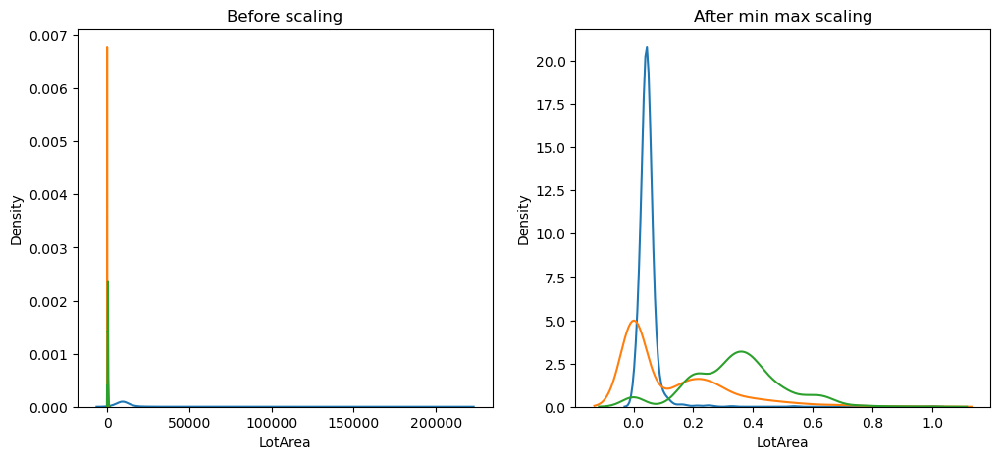

In [723]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (12, 5))

#before scaling
ax1.set_title('Before scaling')
sns.kdeplot(X_train['LotArea'], ax = ax1)
sns.kdeplot(X_train['WoodDeckSF'], ax = ax1)
sns.kdeplot(X_train['GarageArea'], ax = ax1)

#after scaling
ax2.set_title('After min max scaling')
sns.kdeplot(X_train_scaled['LotArea'], ax = ax2)
sns.kdeplot(X_train_scaled['WoodDeckSF'], ax = ax2)
sns.kdeplot(X_train_scaled['GarageArea'], ax = ax2)
plt.show()

### Conclusion:
    -We observe how, after scaling, the distribution of variables is equalized

## Pipeline

In [793]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['SalePrice'], axis = 1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0
)

X_train.shape, X_test.shape

((1022, 80), (438, 80))

In [794]:
X_train.drop(labels=['Id', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1, inplace=True)
X_test.drop(labels=['Id', 'Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1, inplace=True)

In [811]:
algorithms = [
    ('Linear Regression', LinearRegression()),
    ('Random Forest', RandomForestRegressor(n_estimators = 300)),
    ('XGBoost', XGBRFRegressor()),
    ('Decision Tree', DecisionTreeRegressor(max_depth = 5)),
    ('KNeighbors', KNeighborsRegressor())
]

In [812]:
# imputation_steps = [
#     ('imputation_num', MeanMedianImputer(imputation_method = 'median', variables = numerical)),
#     ('imputation_cat', CategoricalImputer(imputation_method = 'frequent', variables = categorical)),
# ]

# imputation_union = FeatureUnion(imputation_steps)

In [830]:

pipe = Pipeline([
    # Imputation
    ('imputation_num', MeanMedianImputer(imputation_method = 'mean', variables = numerical)),
    ('imputation_cat', CategoricalImputer(imputation_method = 'missing', variables = categorical)),
    
    #encoding
    ('rare_encoder', RareLabelEncoder(tol=0.04, n_categories=1)),
    ('encoder', OneHotEncoder(drop_last = True, variables=categorical)),
    
    # Discretization
    ('discretization', EqualFrequencyDiscretiser(q=7, variables = continuous)),
    
    # Transformation
    ('transform', YeoJohnsonTransformer(variables = numerical)),

    # Feature selection
    ('constant_features', DropConstantFeatures(tol = 0.998, missing_values='raise')),
    ('quasi_constant', VarianceThreshold(threshold=0.01)),
    ('duplicated_features', DropDuplicateFeatures(missing_values='raise')),
    ('correlated_features', DropCorrelatedFeatures(threshold=0.75, method='pearson', missing_values='ignore')),
    ('selector', SelectKBest(score_func = f_regression)),
    # Scaler
    ('scaler', RobustScaler()),

    # Algorithm
    algorithms
])

for name, algorithm in algorithms:
    pipe.steps[-1] = (name, algorithm)
    pipe.fit(X_train, y_train)
    
    y_pred_test = pipe.predict(X_test)
    y_pred_train = pipe.predict(X_train)
    
    train_set = round(pipe.score(X_train, y_train) * 100, 2)
    test_set = round(pipe.score(X_test, y_test) * 100, 2)
    
    print(f"Train dataset with {name}: {train_set}%")
    print(f"Test dataset with {name}: {test_set}%")
   

Train dataset with Linear Regression: 75.23%
Test dataset with Linear Regression: 72.61%
Train dataset with Random Forest: 95.66%
Test dataset with Random Forest: 82.27%
Train dataset with XGBoost: 89.76%
Test dataset with XGBoost: 80.85%
Train dataset with Decision Tree: 84.29%
Test dataset with Decision Tree: 76.38%
Train dataset with KNeighbors: 86.18%
Test dataset with KNeighbors: 82.55%


In [814]:
param_grid = {
    'imputation_num__imputation_method':['mean', 'median'],
    'imputation_cat__imputation_method':['frequent', 'missing'],
    'rare_encoder__tol':[0.3, 0.4],
    'rare_encoder__n_categories':[1, 3],
    'encoder' : [
        OneHotEncoder(drop_last = True, ignore_format=False, variables = categorical),
        MeanEncoder(variables = categorical),
        CountFrequencyEncoder(encoding_method = 'count', variables = categorical),
        
    ],
    'discretization__q':[3, 5, 7],
    'transform' : [
        LogCpTransformer(variables = continuous),
        YeoJohnsonTransformer(variables = continuous)
    ],
    'scaler':[
        MinMaxScaler(),
        MaxAbsScaler(),
        RobustScaler()
    ]
}

grid_search = GridSearchCV(pipe, param_grid, cv = 5, n_jobs = -1, scoring = 'r2')

In [815]:
grid_search.fit(X_train, y_train)

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + sel

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warni

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories fo

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.wa

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for var

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + s

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feat

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for vari

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + sel

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:,

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all c

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + s

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for var

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for vari

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for var

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use eithe

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + s

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:,

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] +

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always set

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values we

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + s

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i]

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories fo

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] +

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + sel

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for vari

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories fo

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use e

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + s

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + s

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories fo

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + sel

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:,

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories fo

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories fo

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feat

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i]

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i]

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + se

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for vari

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + sel

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:,

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories fo

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.wa

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for vari

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + se

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i]

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warni

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + sel

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories f

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always se

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + s

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i]

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use ei

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future versi

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] +

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for va

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable GarageFinish is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] +

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always set

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = ne

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for vari

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for v

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning:

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all c

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for varia

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.war

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Utilities is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable LandSlope is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were in

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/transformation/log.py:347: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X.loc[:, self.variables_] = np.log(X.loc[:, self.variables_] + self.C_)
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: 

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable CentralAir is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable PavedDrive is less than that indicated in n_categories. Thus, all categories will be considered frequent
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(
/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/rare_label.py:178: UserWarning: The number of unique categories for variable Street is less than that indicated in n_categories. Thus, all

/opt/anaconda3/envs/KV-AI-JLM-7/lib/python3.9/site-packages/feature_engine/encoding/base_encoder.py:238: UserWarning: During the encoding, NaN values were introduced in the feature(s) Utilities.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('imputation_num',
                                        MeanMedianImputer(variables=['MSSubClass',
                                                                     'LotFrontage',
                                                                     'LotArea',
                                                                     'OverallQual',
                                                                     'OverallCond',
                                                                     'YearBuilt',
                                                                     'YearRemodAdd',
                                                                     'MasVnrArea',
                                                                     'BsmtFinSF1',
                                                                     'BsmtFinSF2',
                                                                     'BsmtUnfSF',
                                                                     'TotalBsmtSF',
                                                                     '1stFlrSF',
                                                                     '2ndFlrSF',
                                                                     'LowQualFinSF',
                                                                     'GrLivArea',
                                                                     'BsmtFullBath',
                                                                     'BsmtHalfBath',
                                                                     'FullBath',
                                                                     'HalfBath',
                                                                     '...
                                                                   '3SsnPorch',
                                                                   'ScreenPorch',
                                                                   'MiscVal']),
                                       YeoJohnsonTransformer(variables=['LotFrontage',
                                                                        'LotArea',
                                                                        'YearBuilt',
                                                                        'YearRemodAdd',
                                                                        'MasVnrArea',
                                                                        'BsmtFinSF1',
                                                                        'BsmtFinSF2',
                                                                        'BsmtUnfSF',
                                                                        'TotalBsmtSF',
                                                                        '1stFlrSF',
                                                                        '2ndFlrSF',
                                                                        'LowQualFinSF',
                                                                        'GrLivArea',
                                                                        'GarageYrBlt',
                                                                        'GarageArea',
                                                                        'WoodDeckSF',
                                                                        'OpenPorchSF',
                                                                        'EnclosedPorch',
                                                                        '3SsnPorch',
                                                                        'ScreenPorch',
                                                                        'MiscVal'])]},
             scoring='r2')

In [819]:
grid_search.best_estimator_

Pipeline(steps=[('imputation_num',
                 MeanMedianImputer(imputation_method='mean',
                                   variables=['MSSubClass', 'LotFrontage',
                                              'LotArea', 'OverallQual',
                                              'OverallCond', 'YearBuilt',
                                              'YearRemodAdd', 'MasVnrArea',
                                              'BsmtFinSF1', 'BsmtFinSF2',
                                              'BsmtUnfSF', 'TotalBsmtSF',
                                              '1stFlrSF', '2ndFlrSF',
                                              'LowQualFinSF', 'GrLivArea',
                                              'BsmtFullBath', 'BsmtHalfBath',
                                              'FullBath', 'HalfBath',
                                              'Bed...
                ('constant_features', DropConstantFeatures(tol=0.998)),
                ('quasi_constant', VarianceThreshold(threshold=0.01)),
                ('duplicated_features',
                 DropDuplicateFeatures(missing_values='raise')),
                ('correlated_features', DropCorrelatedFeatures(threshold=0.75)),
                ('selector',
                 SelectKBest(score_func=<function f_regression at 0x16324db80>)),
                ('scaler', RobustScaler()),
                ('KNeighbors', KNeighborsRegressor())])

In [817]:
grid_search.best_params_

{'discretization__q': 7,
 'encoder': MeanEncoder(variables=['MSZoning', 'Street', 'LotShape', 'LandContour',
                        'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
                        'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
                        'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
                        'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
                        'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
                        'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir',
                        'Electrical', 'KitchenQual', ...]),
 'imputation_cat__imputation_method': 'missing',
 'imputation_num__imputation_method': 'mean',
 'rare_encoder__n_categories': 1,
 'rare_encoder__tol': 0.4,
 'scaler': RobustScaler(),
 'transform': YeoJohnsonTransformer(variables=['LotFrontage', 'LotArea', 'YearBuilt',
                                  'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
            

Text(0, 0.5, 'Predicted Price')

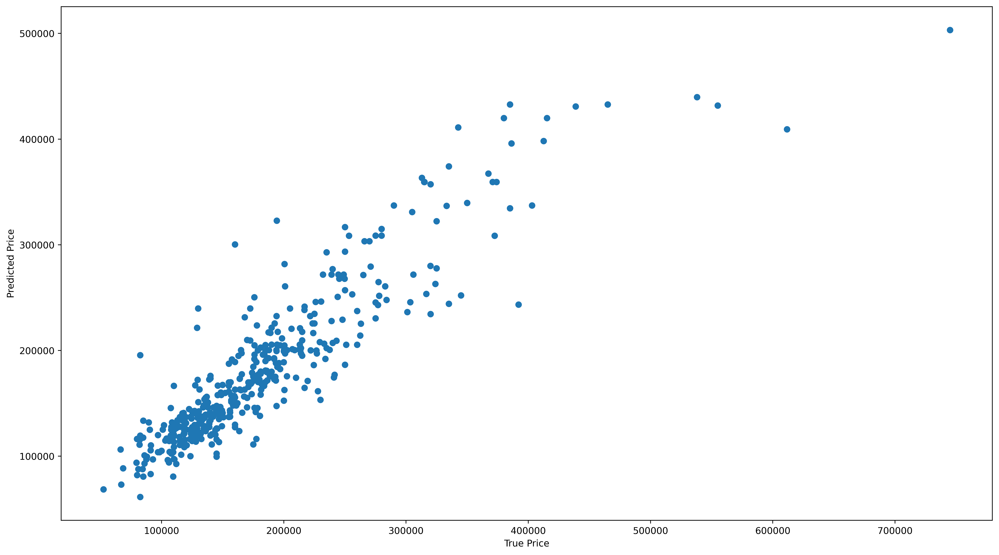

In [820]:
fig = plt.figure(figsize = (18, 10), dpi = 500)
plt.scatter(y_test, y_pred_test)
plt.xlabel('True Price')
plt.ylabel('Predicted Price')

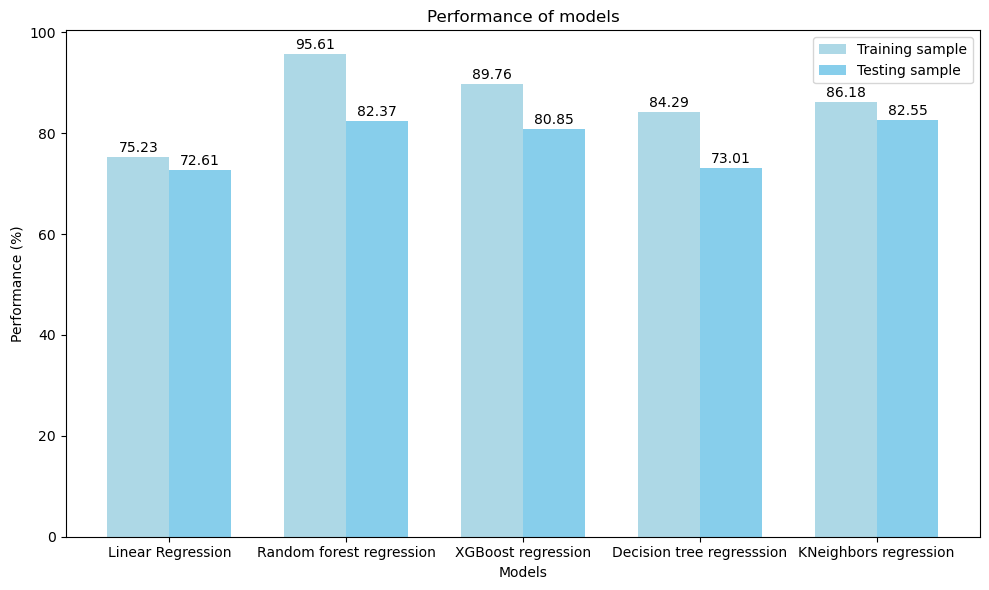

In [824]:
models = ['Linear Regression', 'Random forest regression', 
          'XGBoost regression', 'Decision tree regresssion', 'KNeighbors regression',]

X_train_ordered_performance = [75.23, 95.61, 89.76, 84.29, 86.18]
X_test_ordered_performance = [72.61, 82.37, 80.85, 73.01, 82.55]

bar_width = 0.35

plt.figure(figsize=(10, 6))

index = range(len(models))

plt.bar(index, X_train_ordered_performance, bar_width, color = 'lightblue', label = 'Training sample')

plt.bar([i + bar_width for i in index], X_test_ordered_performance, bar_width, color = 'skyblue', label = 'Testing sample')

plt.title('Performance of models')
plt.xlabel('Models')
plt.ylabel('Performance (%)')

plt.xticks([i + bar_width / 2 for i in index], models)

plt.legend()

for i, value in enumerate(X_train_ordered_performance):
    plt.text(i, value + 1, str(value), ha = 'center')

for i, value in enumerate(X_test_ordered_performance):
    plt.text(i + bar_width, value + 1, str(value), ha = 'center')

plt.tight_layout()
plt.show()

### Conclusion:
    in our dataset there are numeric, discrete, continuous and categorical variables and there are empty values in different types of variables. There are also constant and correlated variables. After analyzing and processing the data, we trained different machine learning models. Judging from the graphs, the best model is produced by KNeighbors Regressor. We can see that our actual and predicted values have a common pattern.